# Investigate simulations with shared soil column per pft, for whole grid cell

Inne Vanderkelen - October 2023

## 1. Settings

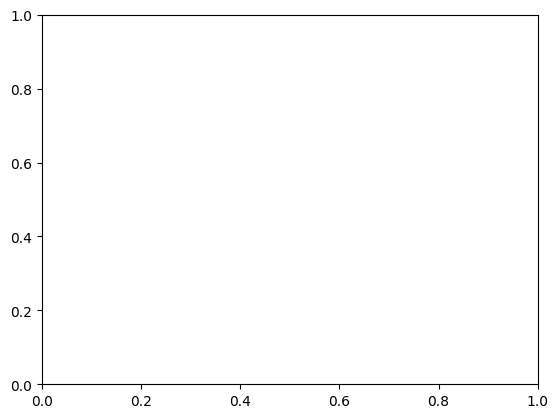

In [1]:
# laod modules 
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import os
import regionmask 

# import own utils module
from iv_utils_daint import *
from ctsm_py.utils import * #info on ctsm utils: https://github .com/NCAR/ctsm_python_gallery 

# do plotting settings
set_plot_param()

# ignore all runtime warnings
warnings.filterwarnings('ignore')

In [2]:
# directory settings

# set directories
outdir = '/scratch/snx3000/ivanderk/'

# Define directory where processing is done 
procdir =  outdir + 'processing_4p1000/' 

# go to processing directory 
os.chdir(procdir)

In [3]:
# case settings

# define scenario
scenario = 'high'

# case settings
case_ctl = 'IHistClm51Sp.hcru_hcru_mt13.pftsoilcol.CTL.spunup'
case_scen = 'IHistClm51Sp.hcru_hcru_mt13.pftsoilcol.'+scenario+'.spunup'

case   = case_ctl
block  = 'lnd' 
stream = 'h0' 

# List of variables to import from file(s) in $indir matching $pattern.
variables = [ "TWS",  "TOTSOILLIQ","TOTSOILICE", "SOILWATER_10CM",  "QINFL" , "QOVER","QRUNOFF", "QDRAI",  "QRUNOFF","ZWT", "FH2OSFC",'EFLX_LH_TOT',
             'QIRRIG_FROM_SURFACE', 'H2OSOI', "SOILLIQ","SOILICE","watsat","QROOTSINK", "QVEGE", "QVEGT","QSOIL",
             "watfc", "EFF_POROSITY", "SOILPSI", "TLAI","FPSN","QHR","SMP","TSA","TG", "RAIN"]

# discard 2004 until 2008 as spin up years
start_year, end_year = 1991, 2014 # 2028 

time_slice = slice(str(start_year)+"-01-01", str(end_year)+"-12-31")


## 2. Load data

### Load simulations

In [4]:
ds_ctl = import_case(case_ctl, myVars=variables, timeSlice=time_slice)

In [5]:
ds_scen = import_case(case_scen, myVars=variables, timeSlice=time_slice)

In [6]:
ds_delta = ds_scen - ds_ctl 

### Load auxiliary data (soil levels, input dataset, wilting point etc) 

In [7]:
# info on soil levels
# manually get soil level info from CLM
levsoi_thickness, levsoi_depth, levgrnd_thickness , levgrnd_depth = get_soildepths()

# get info on soil levels
levsoi = ds_ctl['levsoi'].values
levgrnd = ds_ctl['levgrnd'].values # all soil layers (deepest 5 layers are for thermodynamical calculations)

In [8]:
# input data
# define variables to load from input dataset
input_variables = ['ORGANIC','PFTDATA_MASK','PCT_SAND','PCT_CLAY']

# load inputdata
ds_input, ds_input_scen, landmask = load_inputdata(scenario, input_variables, case_ctl)

In [9]:
# get masks for sandy and clay soils

# define tresholds for pct sand and pct clay
pct_sand_threshold_min = 50
pct_sand_threshold_max = 85
pct_clay_threshold = 40
da_sand_mask, da_clay_mask = get_texture_masks(pct_sand_threshold_max,pct_sand_threshold_min,  pct_clay_threshold, ds_input, levsoi_thickness)



In [10]:
# wilting point
# load precalculated wilting point datasets
da_wilting_h2osoi, da_wilting_h2osoi_scen = load_wilting_h2osoi(scenario) 

### Plotting settings

In [11]:
## settings

# get mask and region ids
exclude_ids = np.array([0,1,2,16,28,29,30,31])
mask = regionmask.defined_regions.ar6.land.mask(ds_ctl['H2OSOI'])

region_ids = np.arange(0,44)
region_ids = np.delete(region_ids, exclude_ids)

plotting_depth = 2 # m 8
figsize = (17,38)


## 3. Analysis & plotting

In [12]:
variables_toplot = [ "TWS",  "TOTSOILLIQ", "SOILWATER_10CM",   "FH2OSFC", "QINFL" , "QOVER", "QRUNOFF", "QDRAI", "ZWT", 'EFLX_LH_TOT',
              "QROOTSINK", "QVEGE", "QVEGT","QSOIL", "watfc", "watsat","EFF_POROSITY", "SOILPSI", "FPSN","QHR","SMP","GSSHA","GSSUN"]

### Plot absolute differences for variables

In [13]:
da_in = ds_ctl["FH2OSFC"]

gridarea = xr.open_dataset('/scratch/snx3000/ivanderk/processing_4p1000/gridarea_0.5x0.5.nc')['cell_area']

(da_in * gridarea)


<xarray.DataArray (time: 288, lat: 360, lon: 720)>
dask.array<mul, shape=(288, 360, 720), dtype=float64, chunksize=(1, 360, 720), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 1991-01-01 00:00:00 ... 2014-12-01 00:00:00
  * lon      (lon) float32 -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
  * lat      (lat) float32 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75

In [13]:
#ds_delta_conv = conv_hydrol_var(ds_delta, variables_toplot)

variables_toplot = [ "TOTSOILLIQ", "SOILWATER_10CM",  "QINFL" , "QOVER", "QRUNOFF", "QDRAI", 'EFLX_LH_TOT',
              "QVEGE", "QVEGT","QSOIL"]

In [1]:
d_vlims = { "QDRAI"         : [-1e-3,1e-3], 
           "QINFL"         : [-1e-3,1e-3],
           "QOVER"         : [-1e-3,1e-3],
           "TOTSOILLIQ"    : [-1e-3,1e-3],
           "SOILWATER_10CM": [-1e-3,1e-3],
           "EFLX_LH_TOT"         : [-1e-3,1e-3],
           "QVEGT"         : [-1e-3,1e-3], 
           "QVEGE"         : [-1e-3,1e-3], 
           "QSOIL"         : [-1e-3,1e-3]}



for i, variable in enumerate(variables_toplot): 

    calc_plot_delta(ds_delta_conv, ds_ctl, variable, d_vlims)

NameError: name 'variables_toplot' is not defined

### relative differences

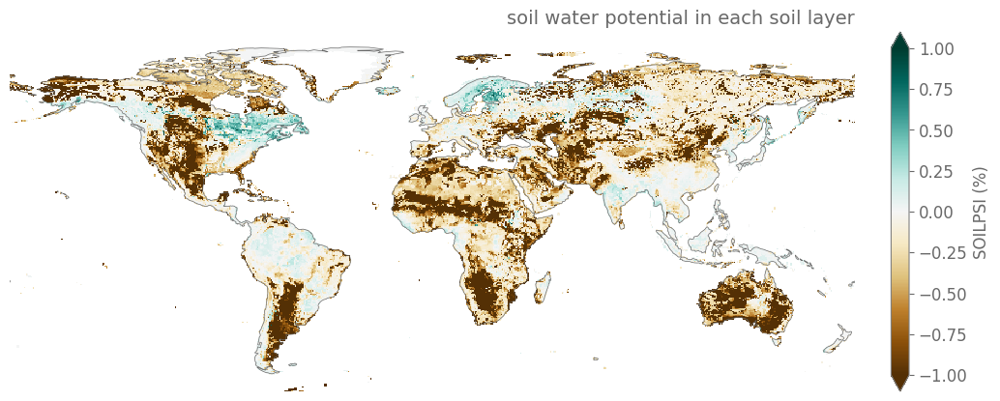

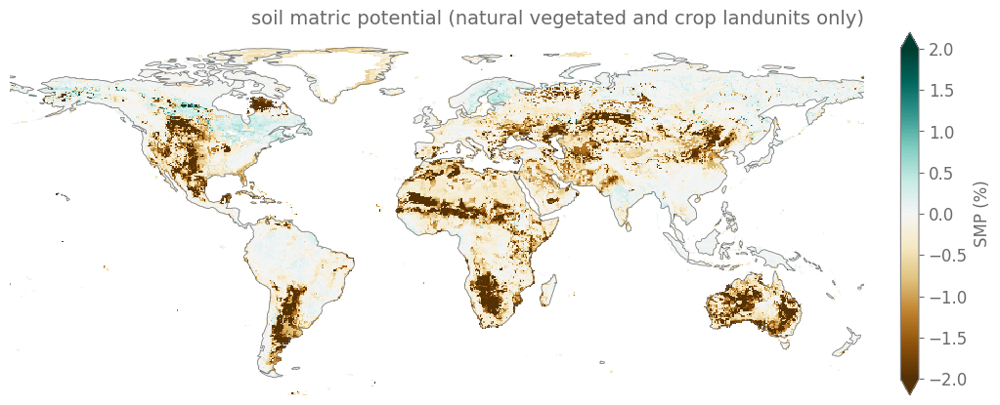

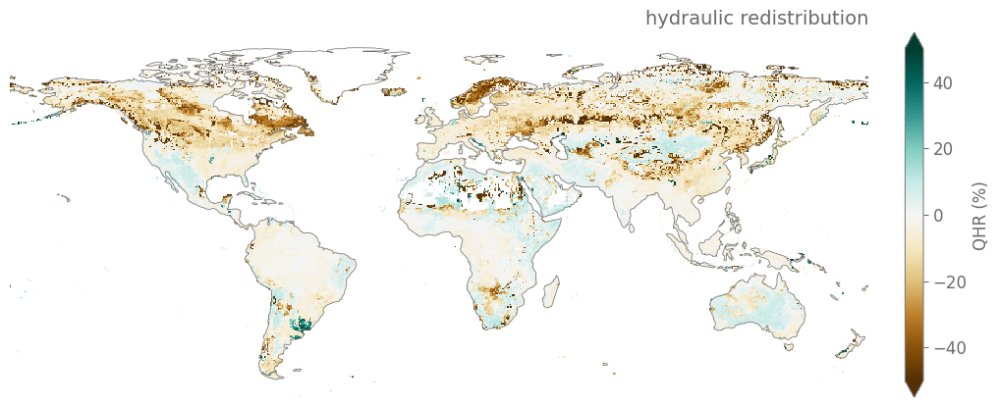

In [13]:
d_vlims = {"QDRAI"         : [-5,5], 
           "QINFL"         :  [-5,5], 
           "QOVER"         :  [-1,1], 
           "QRUNOFF"         : [-1e-7,1e-7],
           "TOTSOILLIQ"    :  [-1,1], 
           "TOTSOILICE"    :  [-10,10], 
           "SOILWATER_10CM":  [-5,5], 
           "TWS"           :  [-1,1], 
           "ZWT"           :  [-1,1], 
           "FH2OSFC"      :  [-5,5], 
           "EFLX_LH_TOT"         : [-1,1],
            "H2OSOI"         : [-0.1,0.1],
            "SOILLIQ"         : [-1,1],
            "SOILICE"         : [-20,20],
           "watfc"         : [-0.01,0.01], 
           "watsat"        : [-0.01,0.01],       
           'SOILPSI'       : [-1,1],
           'SMP'           : [-2,2],
          "QHR" : [-50,50]}

variables = ['SOILPSI','SMP','QHR']
for i, variable in enumerate(variables): 
    calc_plot_delta_rel(ds_delta, ds_ctl, variable, d_vlims)

In [14]:
variables_toplot = ['TOTSOILLIQ', 'SOILWATER_10CM', 'QINFL', 'QOVER', 'QDRAI', 'EFLX_LH_TOT', 'QVEGE', 'QVEGT', 'QSOIL', 'SOILPSI', 'QHR']

<GeoAxes: title={'right': 'volumetric soil water (natural vegetated and crop landunits only)'}>

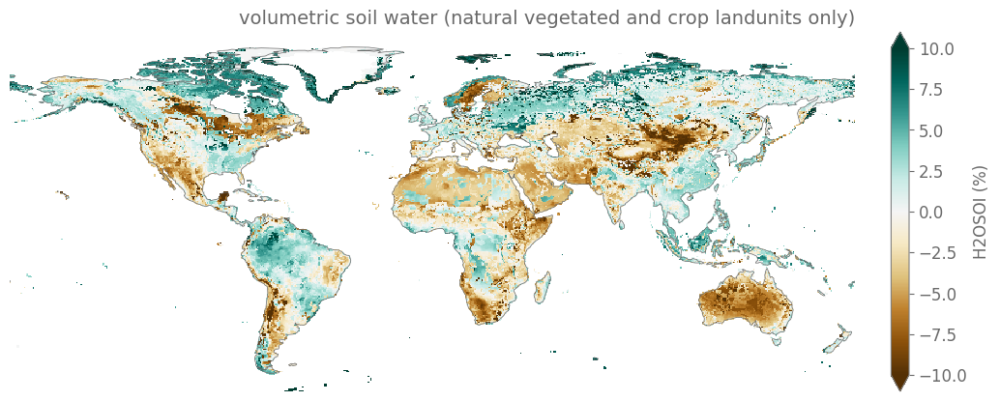

In [25]:
d_vlims = {"H2OSOI" : [-10,10]}


calc_plot_delta_rel(ds_delta.isel(levsoi=0), ds_ctl.isel(levsoi=0), "H2OSOI" , d_vlims)

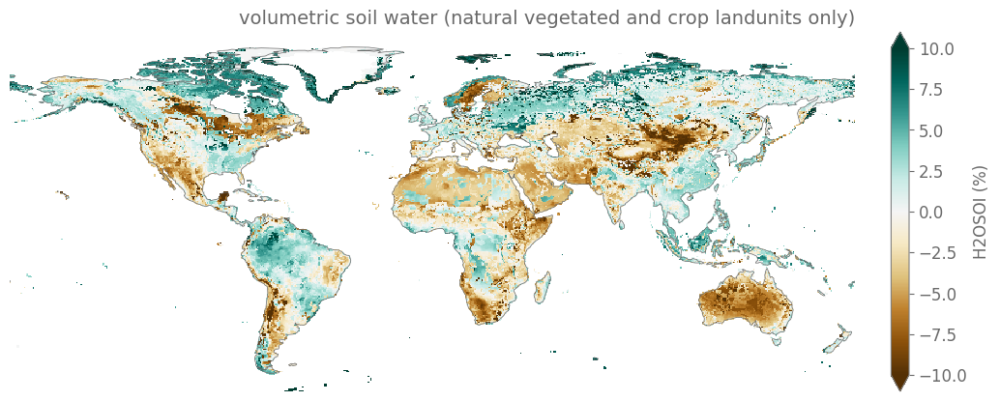

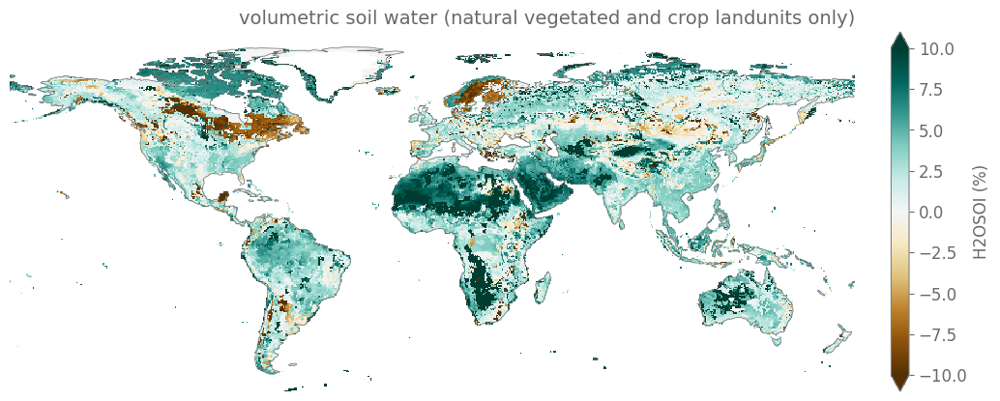

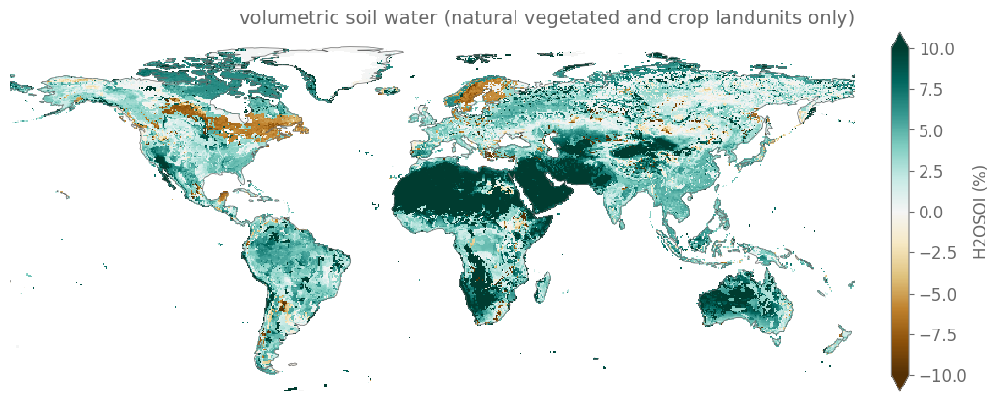

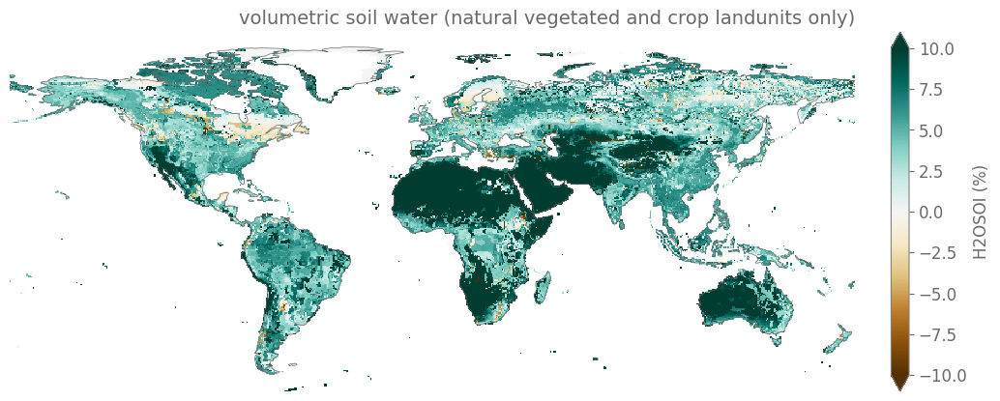

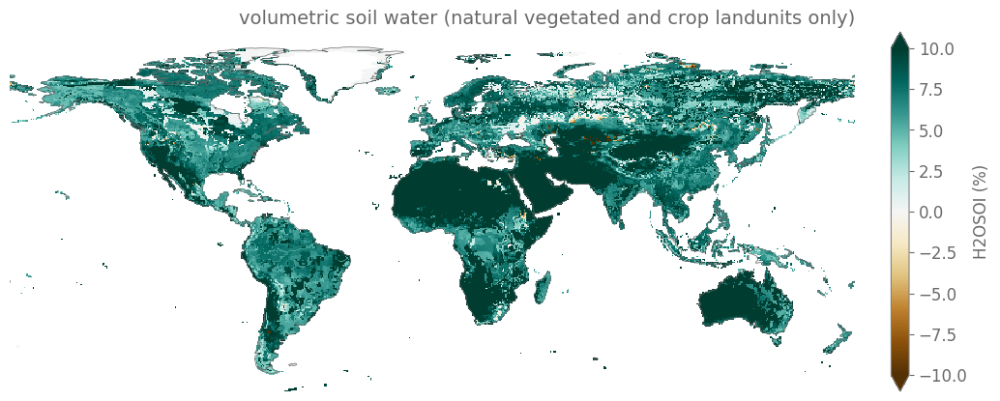

...

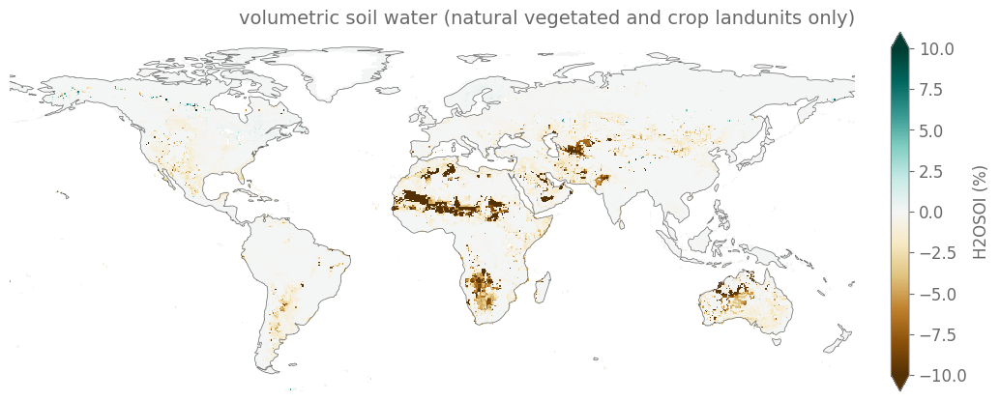

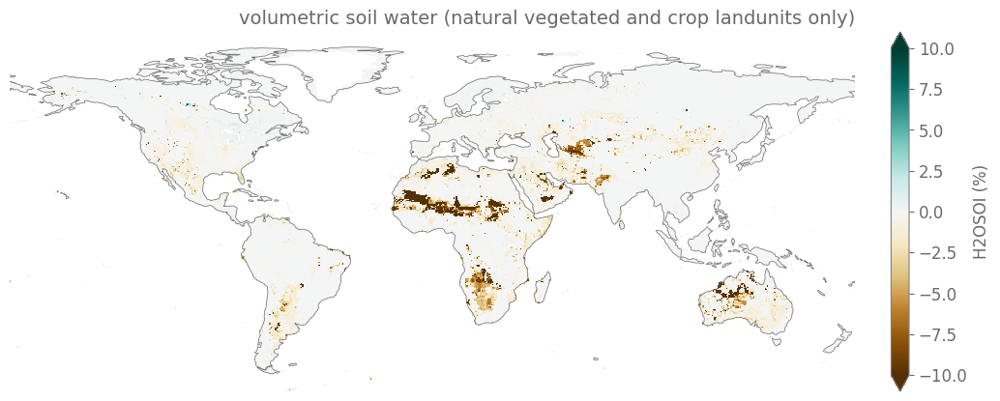

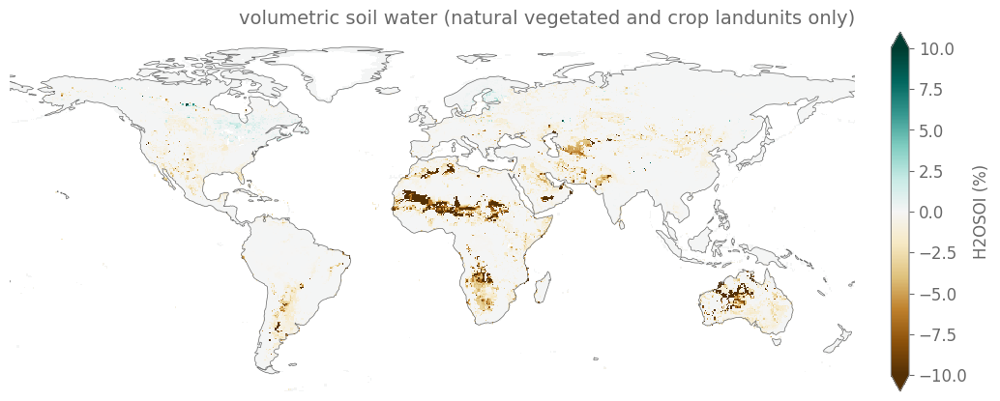

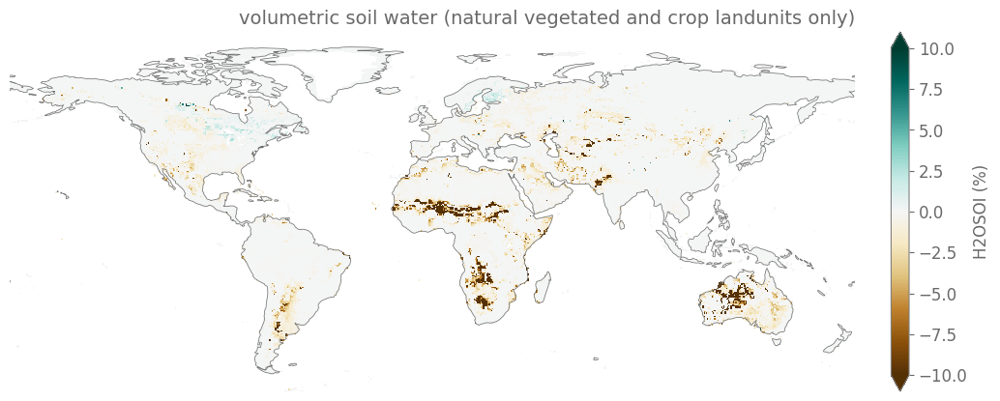

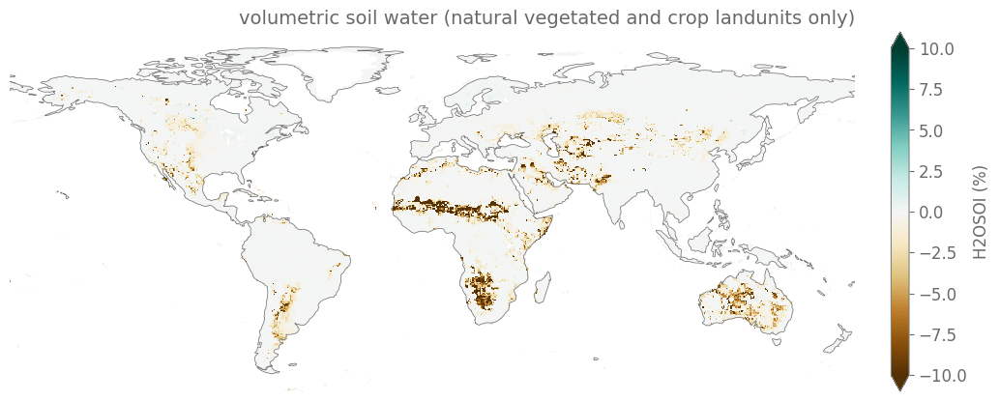

In [29]:
d_vlims = {"H2OSOI" : [-10,10]}

for i in range(0,len(ds_delta["H2OSOI"].levsoi.values)): 
    calc_plot_delta_rel(ds_delta.isel(levsoi=i), ds_ctl.isel(levsoi=0), "H2OSOI" , d_vlims)

QRUNOFF not in limits
QVEGE not in limits
QVEGT not in limits
QSOIL not in limits


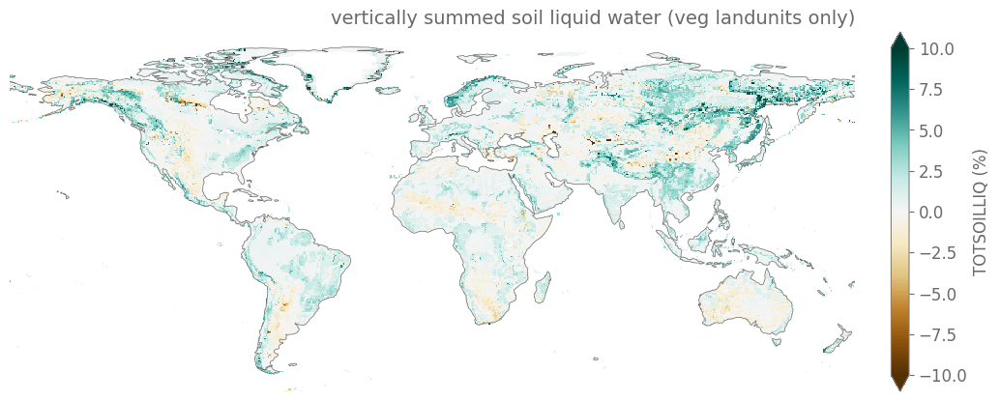

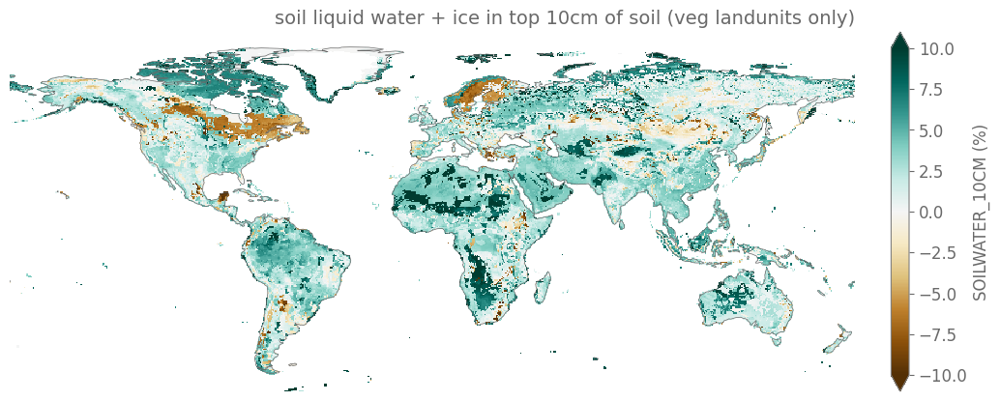

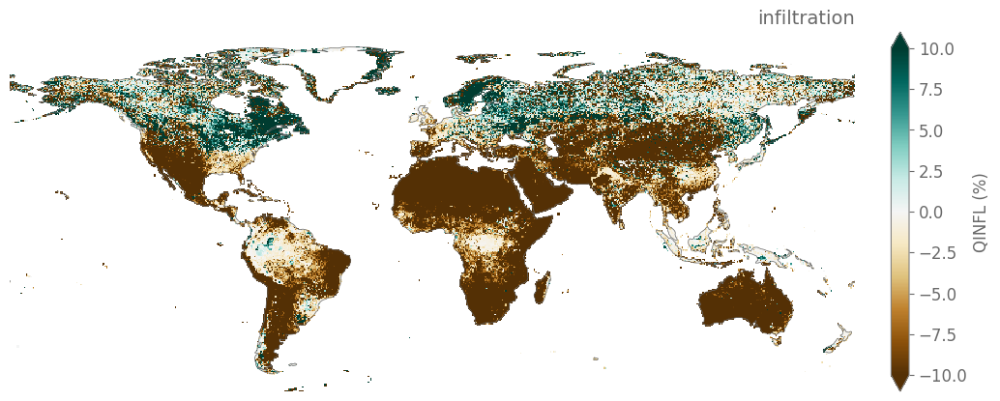

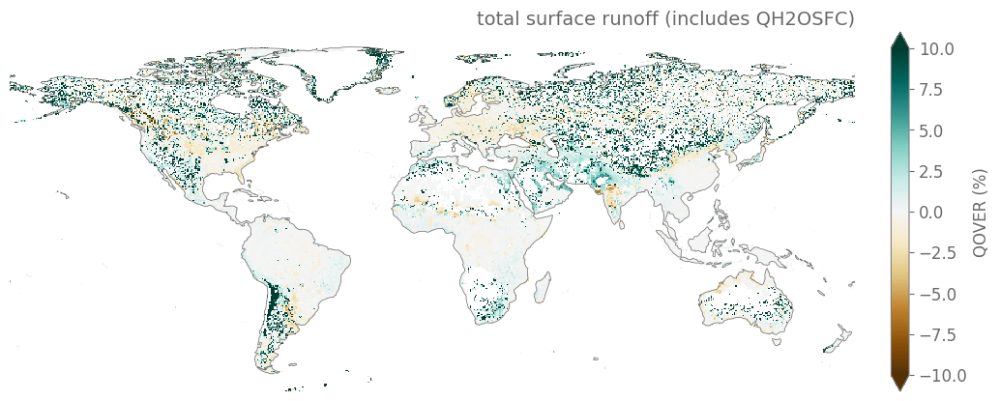

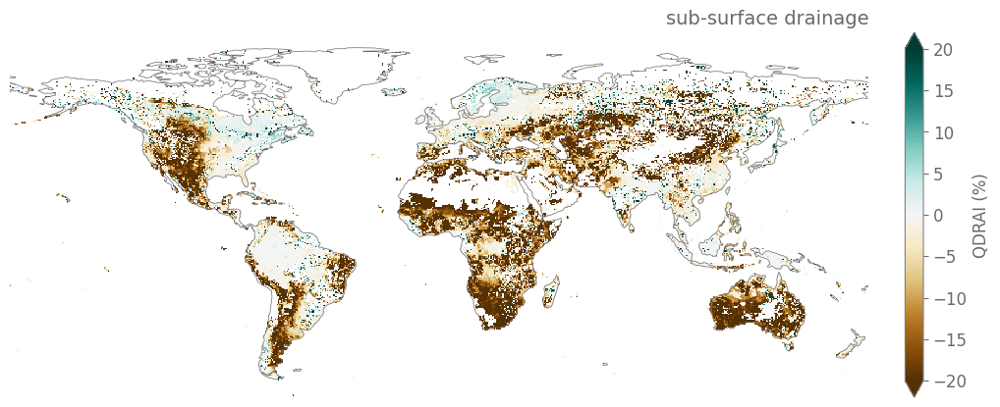

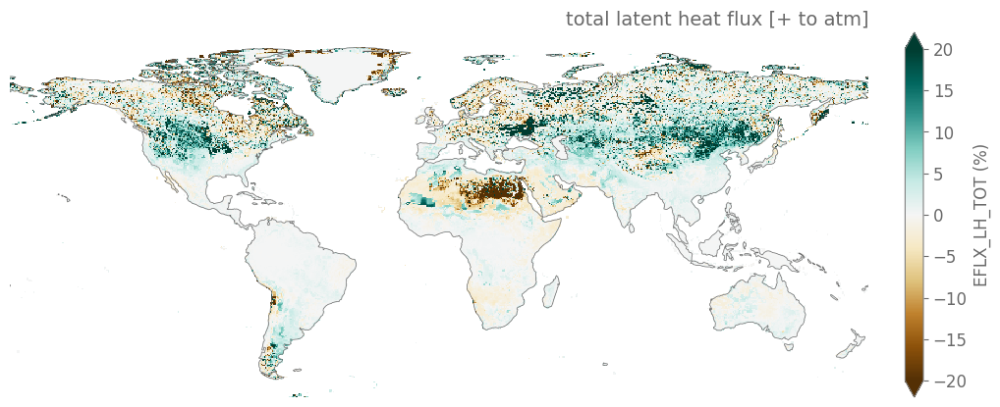

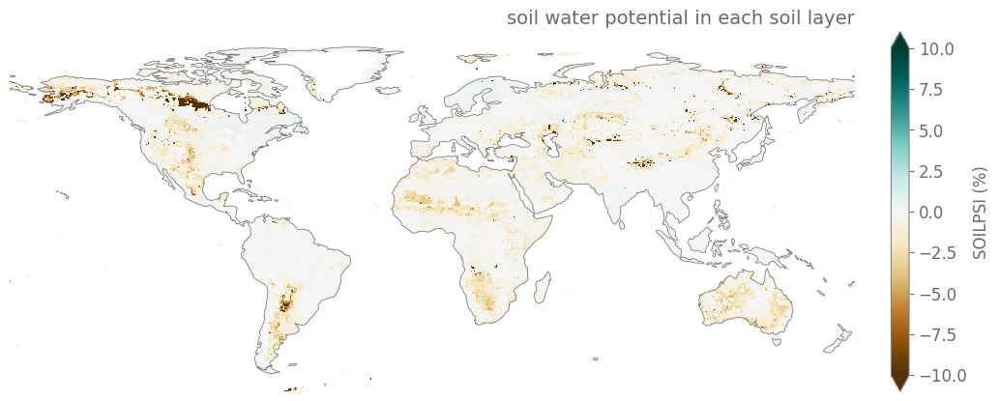

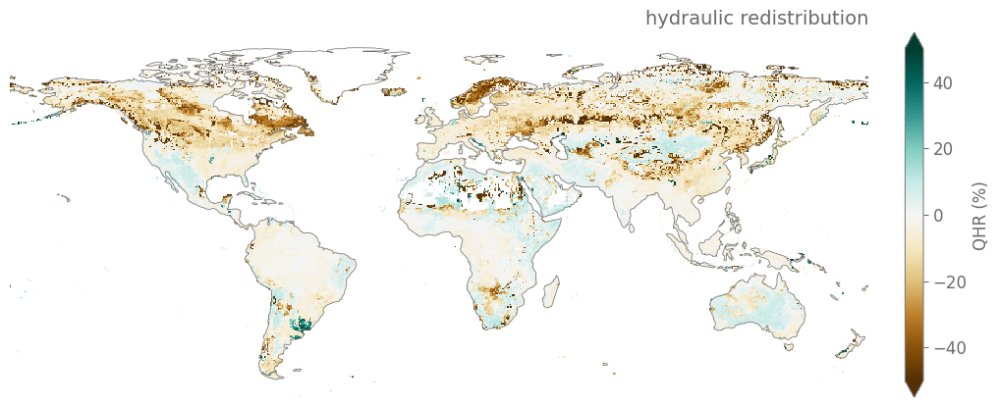

In [30]:
d_vlims = {"QDRAI"         : [-20,20], 
           "QINFL"         :  [-10,10], 
           "QOVER"         :  [-10,10], 
           "TOTSOILLIQ"    :  [-10,10], 
           "SOILWATER_10CM":  [-10,10], 
           "EFLX_LH_TOT"      : [-20,20],
            "H2OSOI"         : [-0.1,0.1],
            "SOILLIQ"         : [-1,1],
            "SOILICE"         : [-20,20], 
           'SOILPSI'       : [-10,10],
           'SMP'           : [-2,2],
          "QHR" : [-50,50]}


for i, variable in enumerate(variables_toplot): 
    calc_plot_delta_rel(ds_delta, ds_ctl, variable, d_vlims)

In [ ]:
ax = calc_plot_delta_rel(ds_delta, ds_ctl, 'TWS', d_vlims)
regionmask.defined_regions.ar6.land.plot(ax=ax, projection=ccrs.Robinson(),  add_ocean=True)

## Deltas of water balance terms

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(12,6), subplot_kw=dict(projection=ccrs.Robinson()))
regionmask.defined_regions.ar6.land.plot(ax=ax, projection=ccrs.Robinson(), label="abbrev", add_ocean=True)

<GeoAxes: >

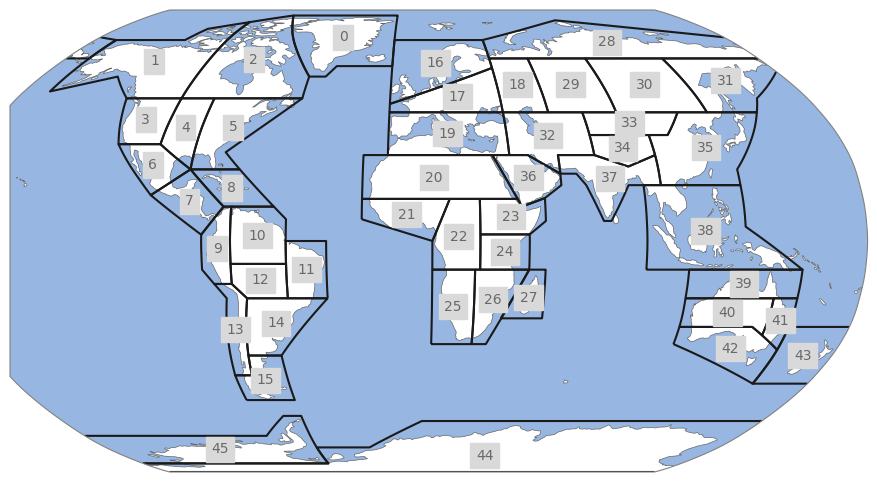

In [19]:
fig, ax = plt.subplots(1,1,figsize=(12,6), subplot_kw=dict(projection=ccrs.Robinson()))
regionmask.defined_regions.ar6.land.plot(ax=ax, projection=ccrs.Robinson(), add_ocean=True)

CPU times: user 17min 3s, sys: 9min 54s, total: 26min 58s
Wall time: 40min 32s


In [34]:
# calculate or load if not existing the time mean of the delta and control dataset
def load_timmean_dataset(case_ctl, stream, start_year, end_year, flag_recalulate=False):
    
    filename_delta_timmean  = procdir+'postprocessing/timmean/'+case_ctl+'_delta.'+stream+'.'+str(start_year)+"-"+str(end_year)+"_timmean.nc"
    filename_ctl_timmean = procdir+'postprocessing/timmean/'+case_ctl+'.'+stream+'.'+str(start_year)+"-"+str(end_year)+"_timmean.nc"

    # do calculation
    if (not os.path.isfile(filename_delta_timmean) and not os.path.isfile(filename_ctl_timmean)) or flag_recalulate:
       
        time_slice = slice(str(start_year)+"-01-01", str(end_year)+"-12-31")
        ds_ctl = import_case(case_ctl, myVars=variables, timeSlice=time_slice)
        ds_scen = import_case(case_scen, myVars=variables, timeSlice=time_slice)

        
        ds_delta_timmean = (ds_delta).mean('time').compute() 
        ds_ctl_timmean = ds_ctl.mean('time').compute()

        
        ds_delta_timmean.to_netcdf(filename_delta_timmean)
        ds_ctl_timmean.to_netcdf(filename_ctl_timmean)

    # load data
    else: 
        
        ds_delta_timmean = xr.open_dataset(filename_delta_timmean)
        ds_ctl_timmean = xr.open_dataset(filename_ctl_timmean)
    
    return ds_delta_timmean, ds_ctl_timmean

In [35]:
%%time
ds_delta_timmean, ds_ctl_timmean = load_timmean_dataset(case_ctl, stream, start_year, end_year)



CPU times: user 40.8 ms, sys: 15.8 ms, total: 56.6 ms
Wall time: 417 ms


In [ ]:
%%time 

flag_calc_wb=True

if flag_calc_wb: 

    variables_wb = ['QDRAI',"FH2OSFC" ,  'QINFL', 'QRUNOFF', 'TOTSOILLIQ', 'EFLX_LH_TOT',   "QVEGE", "QVEGT","QSOIL", "TSA"]
    variables_wb_toplot = ['QDRAI',"FH2OSFC" , 'QINFL', 'QRUNOFF', 'SOILLIQ', 'ET',  "QVEGE", "QVEGT","QSOIL", "TSA"]

    d_wb_vars = {}

    #ds_delta_timmean = (ds_delta).mean('time') 
    #ds_ctl_timmean = ds_ctl.mean('time')

    for i,region in enumerate(region_ids):

        mask = regionmask.defined_regions.ar6.land.mask(ds_delta['H2OSOI'])
        region_name = regionmask.defined_regions.ar6.land[region].name
        region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

        d_var_list = {}
        for variable,variable_toplot in zip(variables_wb,variables_wb_toplot): 
            da_ctl_seasmean_region = (ds_delta_timmean[variable].where(mask==region).mean(dim=('lat','lon')) / ds_ctl_timmean[variable].where(mask==region).mean(dim=('lat','lon'))).values*100

            d_var_list[variable_toplot]= da_ctl_seasmean_region

        d_wb_vars[str(region)] = pd.Series(d_var_list).to_frame(name=str(region))

    df_wbterms = pd.concat([v for k,v in d_wb_vars.items()],axis=1)
    df_wbterms.to_csv(procdir+'postprocessing/wbterm_delta_per_region_'+scenario+'.nc')

    
else: 
    
    df_wbterms = pd.read_csv(procdir+'postprocessing/wbterm_delta_per_region_'+scenario+'.nc', index_col=0)

In [ ]:
fig, axes = plt.subplots(9,4,figsize=figsize)
axes = axes.flatten()

variables_wb_toplot = ['SOILLIQ','QINFL', 'QRUNOFF','ET', "FH2OSFC", 'QDRAI',   'QVEGE', 'QVEGT', 'QSOIL',]

variables_wb = list(df_wbterms.index)
x = np.arange(1,len(variables_wb_toplot)+1,1)

for i,region in enumerate(region_ids):
    
    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

    ax = axes[i]
    df_wbterms.loc[variables_wb_toplot, str(region)].plot.bar(ax=ax, legend=False)
    ax.set_title(region_name,loc='right')
    ax.axhline(y=0, color='dimgray', linewidth=0.5)
    ax.axvline(x=0.5, color='dimgray', linewidth=1, linestyle = 'dotted')
    ax.axvline(x=4.5, color='dimgray', linewidth=1, linestyle = 'dotted')

    ax.set_ylabel('% change')

    ax.set_xticks(range(0,len(variables_wb_toplot)),list(variables_wb_toplot), rotation=45, ha='right')

fig.tight_layout()

In [ ]:
variables_wb_toplot = ['SOILLIQ','QDRAI', 'QOVER',  'ET', 'QVEGE', 'QVEGT', 'QSOIL','QINFL']
figsize = (20,30)


df_wbterms_sand = pd.read_csv(procdir+'postprocessing/wbterm_delta_per_region_'+scenario+'.PCT_SAND.nc', index_col=0)
df_wbterms_clay = pd.read_csv(procdir+'postprocessing/wbterm_delta_per_region_'+scenario+'.PCT_CLAY.nc', index_col=0)

region_ids_sand = list(map(int, df_wbterms_sand.loc[:, (df_wbterms_sand.notna().sum()>0)].keys().values))
region_ids_clay = list(map(int, df_wbterms_clay.loc[:, (df_wbterms_clay.notna().sum()>0)].keys().values))
ids_uniques = set(region_ids_clay + region_ids_sand )


fig, axes = plt.subplots(9,4,figsize=figsize)
axes = axes.flatten()

variables_wb = list(df_wbterms_sand.index)
x = np.arange(1,len(variables_wb)+1,1)

for i,region in enumerate(ids_uniques):
    
    
    df_wbterms_toplot = pd.DataFrame(df_wbterms_sand.loc[variables_wb_toplot, str(region)]).rename(columns={str(region):'sandy soils'})
    df_wbterms_toplot['clay soils'] = df_wbterms_clay.loc[variables_wb_toplot, str(region)]

    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

    ax = axes[i]
    
    df_wbterms_toplot.plot.bar(ax=ax, legend=True)

    ax.set_title(region_name,loc='right')
    ax.axhline(y=0, color='dimgray', linewidth=0.5)
    ax.axvline(x=0.5, color='dimgray', linewidth=1, linestyle = 'dotted')
    ax.axvline(x=3.5, color='dimgray', linewidth=1, linestyle = 'dotted')
    ax.legend(loc='upper left', frameon=False)
    ax.set_ylabel('% change')

    ax.set_xticks(range(0,len(variables_wb_toplot)),list(variables_wb_toplot), rotation=45, ha='right')

fig.tight_layout()

## sandy soils

In [ ]:
texture_mask = da_sand_mask.compute()
texture_name = texture_mask.name

In [18]:
%%time 

flag_calc_wb=False

if flag_calc_wb: 

    variables_wb = ['QDRAI', 'QINFL', 'QOVER', 'TOTSOILLIQ', 'EFLX_LH_TOT',  "QVEGE", "QVEGT","QSOIL"]
    variables_wb_toplot = ['QDRAI', 'QINFL', 'QOVER', 'SOILLIQ', 'ET',  "QVEGE", "QVEGT","QSOIL"]
    
    d_wb_vars = {}

    ds_delta_timmean = (ds_delta).mean('time').where(texture_mask)
    ds_ctl_timmean = ds_ctl.mean('time').where(texture_mask)

    for i,region in enumerate(region_ids):
        print(region)

        mask = regionmask.defined_regions.ar6.land.mask(ds_delta['H2OSOI'])
        region_name = regionmask.defined_regions.ar6.land[region].name
        region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

        d_var_list = {}
        for variable,variable_toplot in zip(variables_wb,variables_wb_toplot): 
            print(variable)
            da_ctl_seasmean_region = (ds_delta_timmean[variable].where(mask==region).mean(dim=('lat','lon')) / ds_ctl_timmean[variable].where(mask==region).mean(dim=('lat','lon'))).values*100

            d_var_list[variable_toplot]= da_ctl_seasmean_region

        d_wb_vars[str(region)] = pd.Series(d_var_list).to_frame(name=str(region))

    df_wbterms = pd.concat([v for k,v in d_wb_vars.items()],axis=1)
    df_wbterms.to_csv(procdir+'postprocessing/wbterm_delta_per_region_'+scenario+'.'+texture_name+'.nc')

    
else: 
    
    df_wbterms = pd.read_csv(procdir+'postprocessing/wbterm_delta_per_region_'+scenario+'.'+texture_name+'.nc', index_col=0)

CPU times: user 4.47 ms, sys: 28 µs, total: 4.5 ms
Wall time: 75.9 ms


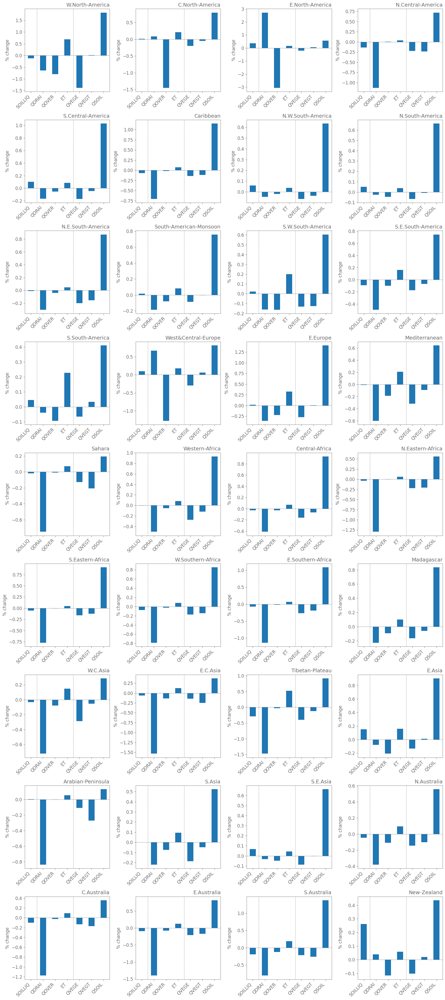

In [19]:
variables_wb_toplot = ['SOILLIQ','QDRAI', 'QOVER',  'ET', 'QVEGE', 'QVEGT', 'QSOIL']

fig, axes = plt.subplots(9,4,figsize=figsize)
axes = axes.flatten()

variables_wb = list(df_wbterms.index)
x = np.arange(1,len(variables_wb)+1,1)

for i,region in enumerate(region_ids):
    
    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

    ax = axes[i]

    df_wbterms.loc[variables_wb_toplot, str(region)].plot.bar(ax=ax, legend=False)
    ax.set_title(region_name,loc='right')
    ax.axhline(y=0, color='dimgray', linewidth=0.5)
    ax.axvline(x=0.5, color='dimgray', linewidth=1, linestyle = 'dotted')
    ax.axvline(x=3.5, color='dimgray', linewidth=1, linestyle = 'dotted')

    ax.set_ylabel('% change')

    ax.set_xticks(range(0,len(variables_wb_toplot)),list(variables_wb_toplot), rotation=45, ha='right')

fig.tight_layout()

## Clay soils

In [28]:
texture_mask = da_clay_mask.compute()
texture_name = texture_mask.name

In [29]:
%%time 

flag_calc_wb=False

if flag_calc_wb: 

    variables_wb = ['QDRAI', 'QINFL', 'QOVER', 'TOTSOILLIQ', 'EFLX_LH_TOT']
    variables_wb_toplot = ['QDRAI', 'QINFL', 'QOVER', 'SOILLIQ', 'ET']

    d_wb_vars = {}

    ds_delta_timmean = (ds_delta).mean('time').where(texture_mask)
    ds_ctl_timmean = ds_ctl.mean('time').where(texture_mask)

    for i,region in enumerate(region_ids):
        print(region)

        mask = regionmask.defined_regions.ar6.land.mask(ds_delta['H2OSOI'])
        region_name = regionmask.defined_regions.ar6.land[region].name
        region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

        d_var_list = {}
        for variable,variable_toplot in zip(variables_wb,variables_wb_toplot): 
            print(variable)
            da_ctl_seasmean_region = (ds_delta_timmean[variable].where(mask==region).mean(dim=('lat','lon')) / ds_ctl_timmean[variable].where(mask==region).mean(dim=('lat','lon'))).values*100

            d_var_list[variable_toplot]= da_ctl_seasmean_region

        d_wb_vars[str(region)] = pd.Series(d_var_list).to_frame(name=str(region))

    df_wbterms = pd.concat([v for k,v in d_wb_vars.items()],axis=1)
    df_wbterms.to_csv(procdir+'postprocessing/wbterm_delta_per_region_'+scenario+'.'+texture_name+'.nc')

    
else: 
    
    df_wbterms = pd.read_csv(procdir+'postprocessing/wbterm_delta_per_region_'+scenario+'.'+texture_name+'.nc', index_col=0)

CPU times: user 5.84 ms, sys: 84 µs, total: 5.92 ms
Wall time: 44.3 ms


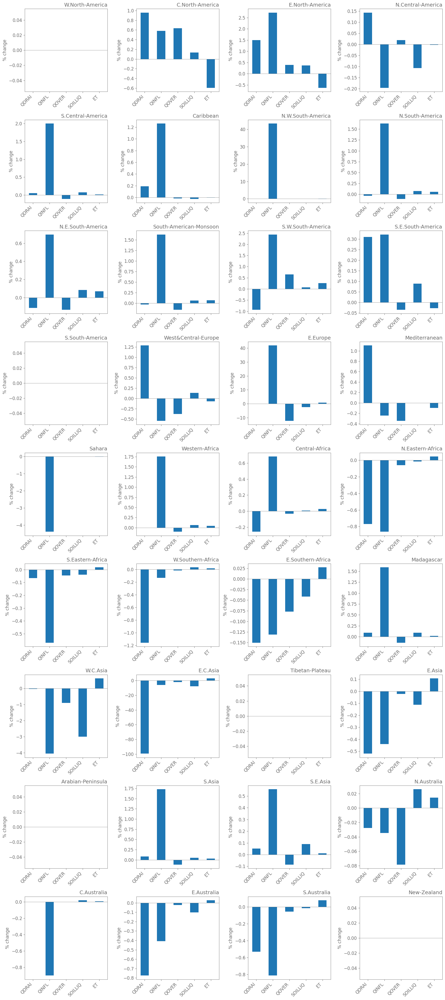

In [30]:
fig, axes = plt.subplots(9,4,figsize=figsize)
axes = axes.flatten()

variables_wb = list(df_wbterms.index)
x = np.arange(1,len(variables_wb)+1,1)

for i,region in enumerate(region_ids):
    
    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

    ax = axes[i]
    df_wbterms[[str(region)]].plot.bar(ax=ax, legend=False)
    ax.set_title(region_name,loc='right')
    ax.axhline(y=0, color='dimgray', linewidth=0.5)
    ax.set_ylabel('% change')

    ax.set_xticks(range(0,len(df_wbterms.index)),list(df_wbterms.index), rotation=45, ha='right')

fig.tight_layout()

In [53]:
780+201+126.05+47.45

1154.5

## calculate cumulative water stress

In [29]:
da_ctl = ds_ctl['H2OSOI'].isel(levsoi=range(0,10))
da_scen  = ds_scen['H2OSOI'].isel(levsoi=range(0,10))

da_wilting_h2osoi['levsoi'] = da_ctl.levsoi
da_wilting_h2osoi_scen['levsoi'] = da_ctl.levsoi

In [55]:
da_ctl

<xarray.DataArray 'H2OSOI' (time: 240, levsoi: 10, lat: 360, lon: 720)>
dask.array<getitem, shape=(240, 10, 360, 720), dtype=float32, chunksize=(1, 10, 360, 720), chunktype=numpy.ndarray>
Coordinates:
  * levsoi   (levsoi) float32 0.01 0.04 0.09 0.16 0.26 0.4 0.58 0.8 1.06 1.36
  * time     (time) object 1995-01-01 00:00:00 ... 2014-12-01 00:00:00
  * lon      (lon) float32 -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
  * lat      (lat) float32 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
Attributes:
    long_name:      volumetric soil water (natural vegetated and crop landuni...
    units:          mm3/mm3
    cell_methods:   time: mean
    landunit_mask:  veg

In [54]:
da_wilting_h2osoi

<xarray.DataArray 'H2OSOI_WILT' (levsoi: 10, lat: 360, lon: 720)>
[2592000 values with dtype=float64]
Coordinates:
  * lat      (lat) float32 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
  * lon      (lon) float32 -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
  * levsoi   (levsoi) float32 0.01 0.04 0.09 0.16 0.26 0.4 0.58 0.8 1.06 1.36

In [30]:
da_stress_cumulative_ctl  = calc_annual_cumulative_stress(da_ctl,  da_wilting_h2osoi) 
da_stress_cumulative_scen = calc_annual_cumulative_stress(da_scen, da_wilting_h2osoi_scen) 

da_delta_stress = (da_stress_cumulative_scen - da_stress_cumulative_ctl).mean('year').squeeze().compute()

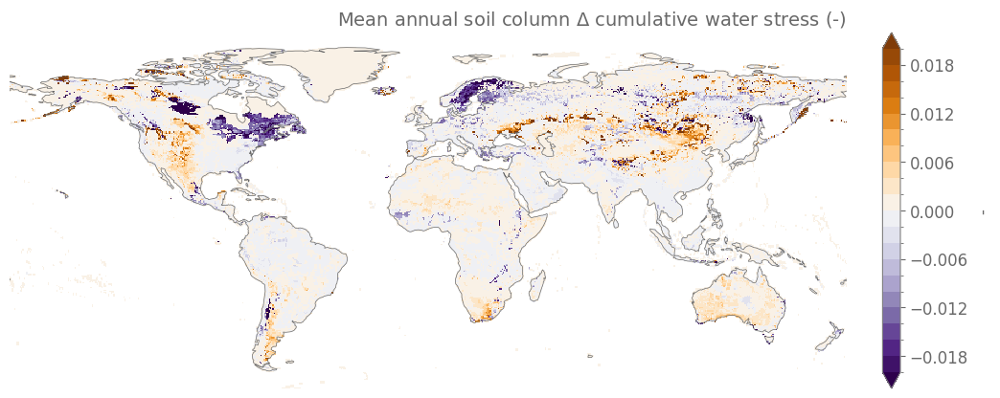

In [31]:
plt.figure(figsize=(12,5))
proj=ccrs.PlateCarree()
ax = plt.subplot(111, projection=proj)

levels = np.arange(-0.02,0.022,0.002)
da_delta_stress.weighted(da_delta_stress.levsoi).mean('levsoi').where(landmask).plot(ax=ax, cmap='PuOr_r', cbar_kwargs={'label': '-', 'fraction': 0.02, 'pad': 0.04}, levels=levels)
ax.set_title(' ', loc='center')
ax.set_title('Mean annual soil column $\Delta$ cumulative water stress (-)', loc='right')
ax.coastlines(color='dimgray', linewidth=0.5)
ax.set_extent((-180,180,-63,90), crs=proj);
ax.axis('off');

In [32]:
da_delta_stress_mm = (da_delta_stress*np.expand_dims(np.expand_dims(levsoi_thickness[0:10], axis=1), axis=2)*1000).sum('levsoi')

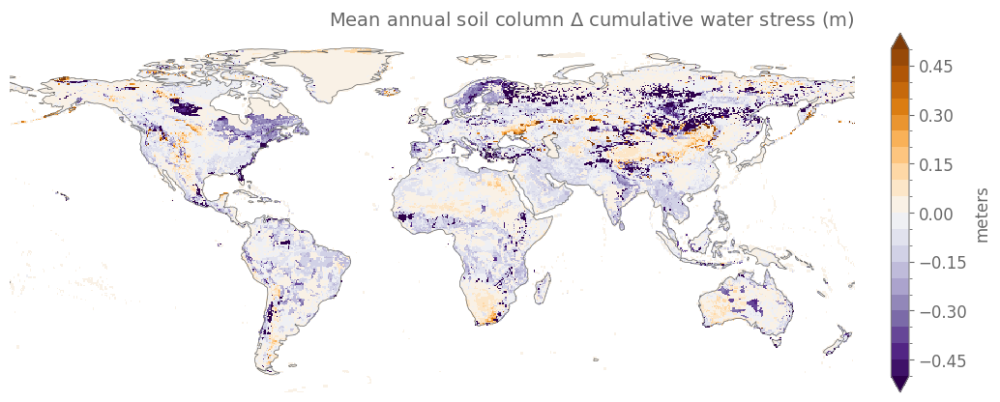

In [33]:
plt.figure(figsize=(12,5))
proj=ccrs.PlateCarree()
ax = plt.subplot(111, projection=proj)

levels = np.arange(-0.5,0.55,0.05)
(da_delta_stress_mm*10e-3).where(landmask).plot(ax=ax, cmap='PuOr_r', cbar_kwargs={'label': 'meters', 'fraction': 0.02, 'pad': 0.04}, levels=levels)
ax.set_title(' ', loc='center')
ax.set_title('Mean annual soil column $\Delta$ cumulative water stress (m)', loc='right')
ax.coastlines(color='dimgray', linewidth=0.5)
ax.set_extent((-180,180,-63,90), crs=proj);
ax.axis('off');

In [60]:
da_delta_stress_mm_upper60cm = (da_delta_stress[0:7,:,:]*np.expand_dims(np.expand_dims(levsoi_thickness[0:7], axis=1), axis=2)*1000).sum('levsoi')

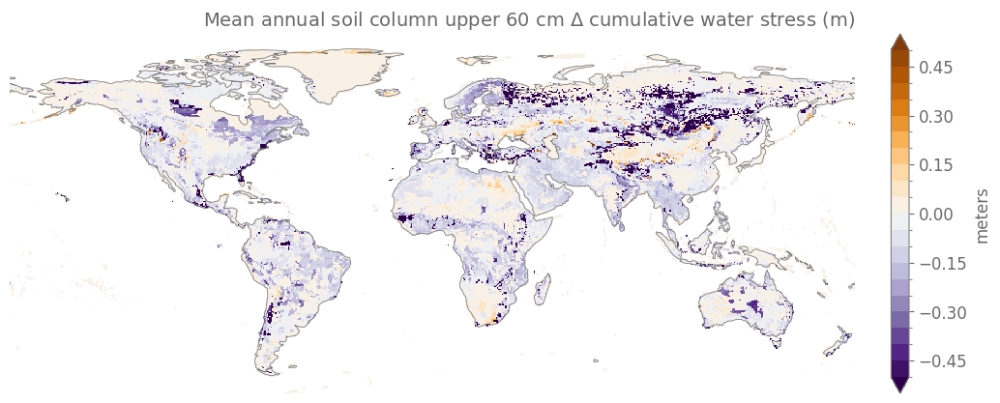

In [64]:
plt.figure(figsize=(12,5))
proj=ccrs.PlateCarree()
ax = plt.subplot(111, projection=proj)

levels = np.arange(-0.5,0.55,0.05)
(da_delta_stress_mm_upper60cm*10e-3).where(landmask).plot(ax=ax, cmap='PuOr_r', cbar_kwargs={'label': 'meters', 'fraction': 0.02, 'pad': 0.04}, levels=levels)
ax.set_title(' ', loc='center')
ax.set_title('Mean annual soil column upper 60 cm $\Delta$ cumulative water stress (m)', loc='right')
ax.coastlines(color='dimgray', linewidth=0.5)
ax.set_extent((-180,180,-63,90), crs=proj);
ax.axis('off');

In [38]:
stress_mask = (da_delta_stress_mm<0)

In [41]:
irrig_mask = xr.open_dataset(procdir+'irrigation_mask.nc')['QIRRIG_FROM_SURFACE']

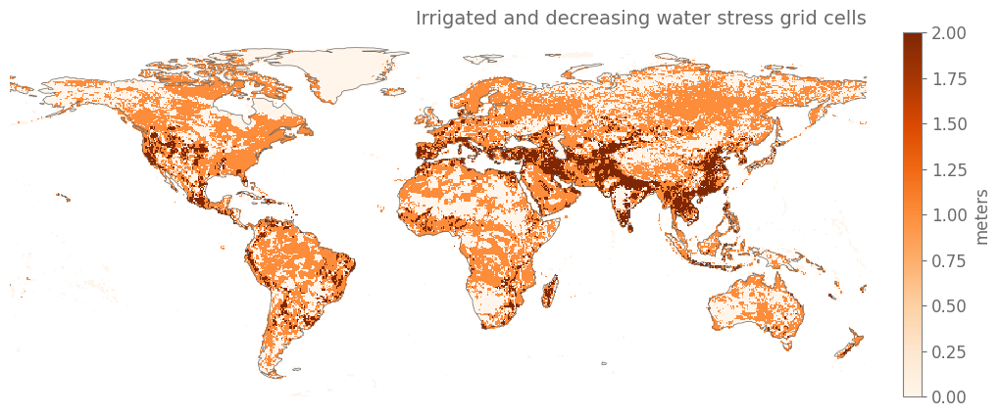

In [51]:
plt.figure(figsize=(12,5))
proj=ccrs.PlateCarree()
ax = plt.subplot(111, projection=proj)
(stress_mask*1+irrig_mask*1).where(landmask).plot(ax=ax, cmap='Oranges', cbar_kwargs={'label': 'meters', 'fraction': 0.02, 'pad': 0.04})
ax.set_title(' ', loc='center')
ax.set_title('Irrigated and decreasing water stress grid cells', loc='right')
ax.coastlines(color='dimgray', linewidth=0.5)
ax.set_extent((-180,180,-63,90), crs=proj);
ax.axis('off');

In [50]:
irrig_mask+stress_mask

<xarray.DataArray (lat: 360, lon: 720)>
array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])
Coordinates:
  * lon      (lon) float32 -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
  * lat      (lat) float32 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75

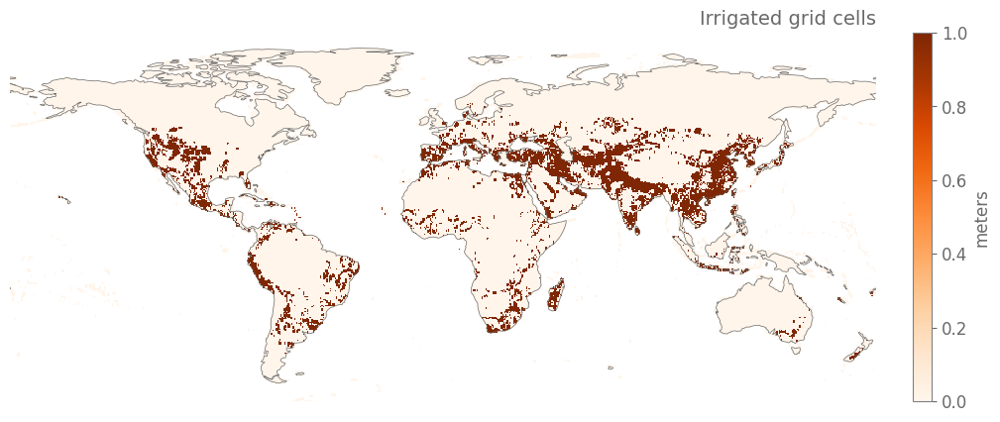

In [48]:
plt.figure(figsize=(12,5))
proj=ccrs.PlateCarree()
ax = plt.subplot(111, projection=proj)
(irrig_mask).where(landmask).plot(ax=ax, cmap='Oranges', cbar_kwargs={'label': 'meters', 'fraction': 0.02, 'pad': 0.04})
ax.set_title(' ', loc='center')
ax.set_title('Irrigated grid cells', loc='right')
ax.coastlines(color='dimgray', linewidth=0.5)
ax.set_extent((-180,180,-63,90), crs=proj);
ax.axis('off');

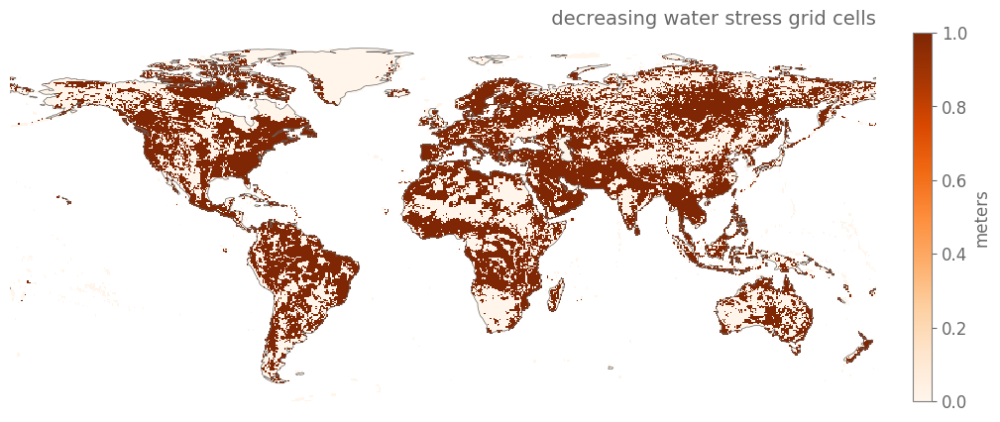

In [49]:
plt.figure(figsize=(12,5))
proj=ccrs.PlateCarree()
ax = plt.subplot(111, projection=proj)
(stress_mask).where(landmask).plot(ax=ax, cmap='Oranges', cbar_kwargs={'label': 'meters', 'fraction': 0.02, 'pad': 0.04})
ax.set_title(' ', loc='center')
ax.set_title(' decreasing water stress grid cells', loc='right')
ax.coastlines(color='dimgray', linewidth=0.5)
ax.set_extent((-180,180,-63,90), crs=proj);
ax.axis('off');

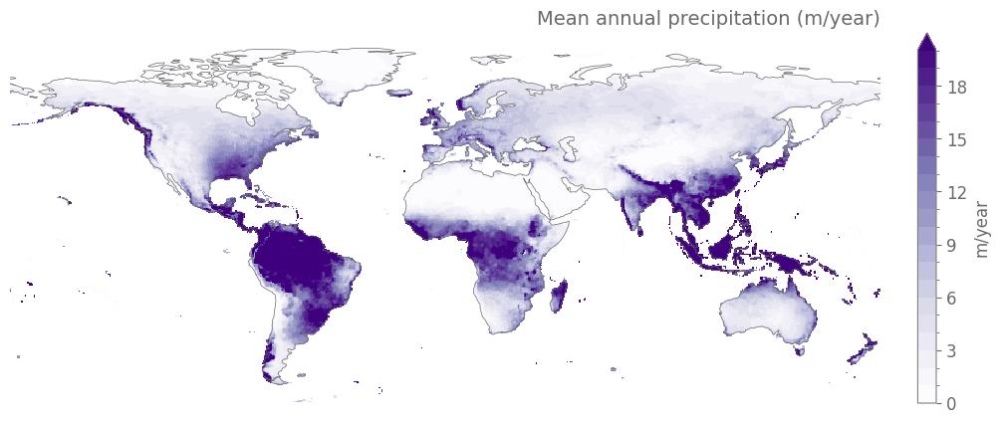

In [66]:
plt.figure(figsize=(12,5))
proj=ccrs.PlateCarree()
ax = plt.subplot(111, projection=proj)

levels = np.arange(0,21,1)
da_ctl_precip.where(landmask).plot(ax=ax, cmap='Purples', cbar_kwargs={'label': 'm/year', 'fraction': 0.02, 'pad': 0.04}, levels=levels)
ax.set_title(' ', loc='center')
ax.set_title('Mean annual precipitation (m/year)', loc='right')
ax.coastlines(color='dimgray', linewidth=0.5)
ax.set_extent((-180,180,-63,90), crs=proj);
ax.axis('off');

In [49]:
da_delta_stress_soil = da_delta_stress.weighted(da_delta_stress.levsoi).mean('levsoi')

## Plot differences in seasonal amplitude ("Sponginess?") -- not working check simulations!!!!


In [14]:
%%time

# calculate regional averages
flag_calc_regional_means = True

variable= 'H2OSOI'

if flag_calc_regional_means: 
    
    ds_ctl_seasmean = ds_ctl.groupby('time.month').mean(skipna=True)
    ds_scen_seasmean = ds_scen.groupby('time.month').mean(skipna=True)
    
    da_ctl_relsat = (ds_ctl_seasmean['H2OSOI']/ds_ctl_seasmean['watsat'].rename({'levgrnd':'levsoi'})).assign_attrs({'name':'Saturation fration'})
    da_scen_relsat = (ds_scen_seasmean['H2OSOI']/ds_scen_seasmean['watsat'].rename({'levgrnd':'levsoi'})).assign_attrs({'name':'Saturation fration'})

    d_ctl_region = {}
    d_scen_region = {}
    d_delta_region = {}
    d_ctl_region_qroot = {}

    d_ctl_relsat_region = {}
    d_scen_relsat_region = {}
    d_delta_relsat_region = {}
    
    for i,region in enumerate(region_ids):

        region_name = regionmask.defined_regions.ar6.land[region].name
        region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

        da_ctl_seasmean_region = ds_ctl_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
        da_scen_seasmean_region = ds_scen_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))

        da_delta_region = (da_scen_seasmean_region - da_ctl_seasmean_region)/da_ctl_seasmean_region *100
        
        d_ctl_region[region_name]       = da_ctl_seasmean_region
        d_scen_region[region_name]      = da_scen_seasmean_region       
        d_delta_region[region_name]     = da_delta_region
        

        da_ctl_relsat_region = da_ctl_relsat.where(mask==region).mean(dim=('lat','lon'))
        da_scen_relsat_region = da_scen_relsat.where(mask==region).mean(dim=('lat','lon'))

        da_delta_relsat_region = (da_scen_relsat_region - da_ctl_relsat_region)/da_ctl_relsat_region *100
        da_delta_relsat_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units'],'name':'Saturation fration'}
        
        d_ctl_relsat_region[region_name]    = da_ctl_relsat_region
        d_scen_relsat_region[region_name]   = da_scen_relsat_region
        d_delta_relsat_region[region_name]  = da_delta_relsat_region        
        
        da_ctl_seasmean_region_qroot = ds_ctl_seasmean['QROOTSINK'].where(mask==region).mean(dim=('lat','lon'))
        d_ctl_region_qroot[region_name] = da_ctl_seasmean_region_qroot       


CPU times: user 3.83 s, sys: 20.2 ms, total: 3.85 s
Wall time: 3.83 s


#### Delta volumetric water content

In [ ]:
%%time

fig, axes = plt.subplots(9,4,figsize=figsize)
axes = axes.flatten()

flag_plot_rootuptake = False

for i,region in enumerate(region_ids):
    
    ax = axes[i]

    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

     
    levels = np.arange(-1,1.1,0.1)
    levels_ticks =  np.arange(-1,1.2,0.2)
    ticks = levels_ticks
    
    d_delta_region[region_name].plot.contourf(ax=ax, x='month', y='levsoi', cmap='RdBu', cbar_kwargs={'label': da_ctl_seasmean_region.name+' (-)', 'ticks':ticks}, levels=levels)
    ax.set_title('$\Delta$ '+region_name, loc='right')
    ax.set_ylim([plotting_depth,0])
    
    ax.hlines(levsoi_depth, 1,12, color='grey', alpha=0.2)
    ax.hlines(levsoi_depth[7],1,12, color='darkgrey', alpha=1)
    
    # plot QROOT
    if flag_plot_rootuptake: 
        levels_qroot = np.arange(0,2.75e-6,0.5e-6)
        cs = d_ctl_region_qroot[region_name].plot.contour(ax=ax,  x='month', y='levsoi', label='Root water uptake', levels=levels_qroot, colors='dimgray')
        ax.clabel(cs, inline=True, fontsize=10)

    ax.set_ylabel('Soil depth (m)')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()
    

#### Control volumetric water content

In [ ]:
variable= 'H2OSOI'

fig, axes = plt.subplots(9,4,figsize=figsize)
axes = axes.flatten()


for i,region in enumerate(region_ids):
    
    ax = axes[i]

    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev


    levels = [0,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55, 0.6,0.65,0.7,0.75,0.8]
    levels_ticks = [0,0.1,0.2,0.3,0.4,0.5, 0.6,0.7,0.8]

    ticks = levels_ticks
    
    d_ctl_region[region_name].plot.contourf(ax=ax, x='month', y='levsoi', cmap='Blues', cbar_kwargs={'label': da_ctl_seasmean_region.name+' (-)', 'ticks':ticks}, levels=levels)
    ax.set_title('$\Delta$ '+region_name, loc='right')
    ax.set_ylim([plotting_depth,0])

    ax.hlines(levsoi_depth, 1,12, color='grey', alpha=0.2)
    ax.hlines(levsoi_depth[7],1,12, color='darkgrey', alpha=1)

    ax.set_ylabel('Soil depth (m)')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

### relative saturation of control run

In [ ]:
variable= 'H2OSOI'

fig, axes = plt.subplots(9,4,figsize=figsize)
axes = axes.flatten()


for i,region in enumerate(region_ids):
    
    ax = axes[i]

    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

    
    levels = [-0.6,-0.55,-0.5,-0.44,-0.4,-0.35,-0.3,-0.25,-0.2,-0.15,-0.1,-0.05,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55, 0.6]
    ticks = [-0.6,-0.4,-0.2,-0.05,0.05,0.2,0.4, 0.6]    
    
    d_delta_relsat_region[region_name].plot.contourf(ax=ax, x='month', y='levsoi', cmap='Blues', cbar_kwargs={'label':' Saturation ratio (-)', 'ticks':ticks}, levels= levels)
    ax.set_title(region_name, loc='right')
    ax.set_ylim([plotting_depth,0])

    ax.hlines(levsoi_depth, 1,12, color='grey', alpha=0.2)
    ax.hlines(levsoi_depth[7],1,12, color='darkgrey', alpha=1)

    ax.set_ylabel('Soil depth (m)')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

## Water stress

In [ ]:
da_wilting_h2osoi =  ds_wilting_h2osoi['H2OSOI_WILT']

In [ ]:
da_wilting_h2osoi_4pct = ds_wilting_h2osoi_4pct['H2OSOI_WILT']

### plot control case water stress

In [ ]:
variable= 'H2OSOI'

mask = regionmask.defined_regions.ar6.land.mask(ds_ctl_seasmean[variable])

region_ids = np.arange(0,44)
fig, axes = plt.subplots(11,4,figsize=(14,50))
axes = axes.flatten()


for i,region in enumerate(region_ids):
    
    ax = axes[i]

    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

    da_delta_region = (ds_ctl_seasmean['H2OSOI'][:,:10,:,:] - da_wilting_h2osoi).where(mask==region).mean(dim=('lat','lon'))
    da_delta_region = da_delta_region.where(da_delta_region>=0)
    levels = [0,0.05,0.1,0.15,0.2,0.25,0.3]
    levels_ticks = [0,0.05,0.2,0.4, 0.6, 0.8,1]

    ticks = levels
    
    
    da_delta_region.plot.contourf(ax=ax, x='month', y='levsoi', cmap='Reds', cbar_kwargs={'label':' (%)', 'ticks':ticks}, levels= levels)
    ax.set_title('$\Delta$ '+region_name, loc='right')
    ax.set_ylim([8,0])
    #da_ctl_seasmean_region_zwt.plot(ax=ax, label='CTL', color='k')
    #da_ctl_seasmean_region_4p1000.plot(ax=ax, label='4p100', color='k')

    #ax.legend(loc='lower left')
    ax.set_ylabel('Soil depth (m)')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

## difference in WILTING POINTS 4PCT-CTL

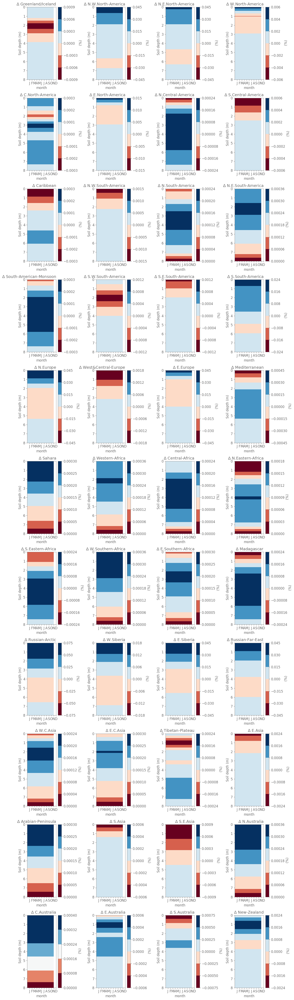

In [40]:
variable= 'H2OSOI'

mask = regionmask.defined_regions.ar6.land.mask(ds_ctl_seasmean[variable])

region_ids = np.arange(0,44)
fig, axes = plt.subplots(11,4,figsize=(14,50))
axes = axes.flatten()


for i,region in enumerate(region_ids):
    
    ax = axes[i]

    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev
    
    da_seasmean_region = da_wilting_h2osoi.expand_dims(dim={"month": 12}).where(mask==region).mean(dim=('lat','lon'))
    da_seasmean_region_4pct = da_wilting_h2osoi_4pct.expand_dims(dim={"month": 12}).where(mask==region).mean(dim=('lat','lon'))

    da_delta_region = da_seasmean_region_4pct - da_seasmean_region
    levels = [0,0.05,0.1,0.15,0.2,0.25,0.3]
    levels_ticks = [0,0.05,0.2,0.4, 0.6, 0.8,1]

    ticks = levels
    
    
    da_delta_region.plot.contourf(ax=ax, x='month', y='levsoi', cmap='RdBu', cbar_kwargs={'label':' (%)'})#, levels= levels)
    ax.set_title('$\Delta$ '+region_name, loc='right')
    ax.set_ylim([8,0])
    #da_ctl_seasmean_region_zwt.plot(ax=ax, label='CTL', color='k')
    #da_ctl_seasmean_region_4p1000.plot(ax=ax, label='4p100', color='k')

    #ax.legend(loc='lower left')
    ax.set_ylabel('Soil depth (m)')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

### Difference in water stress per region

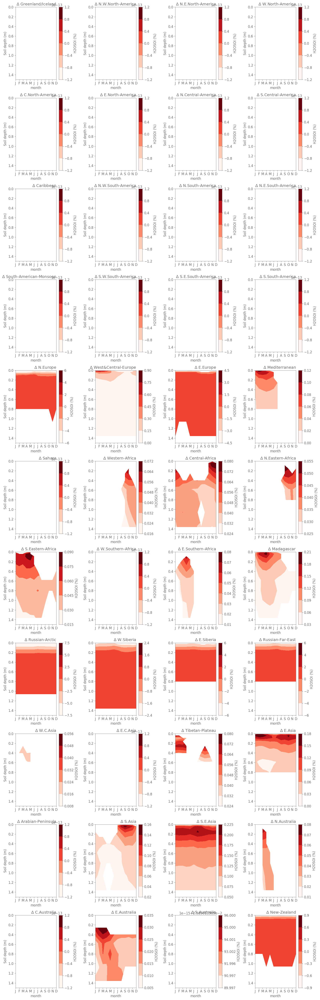

In [31]:
# zoom on regions highly active

variable= 'H2OSOI'

mask = regionmask.defined_regions.ar6.land.mask(ds_ctl_seasmean[variable])

region_ids = np.arange(0,44)
fig, axes = plt.subplots(11,4,figsize=(16,50))
axes = axes.flatten()


for i,region in enumerate(region_ids):
    
    ax = axes[i]

    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

    

    da_ctl_seasmean_region = ds_ctl_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_4pct_seasmean_region = ds_4pct_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_wilting_h2osoi_region = da_wilting_h2osoi.where(mask==region).mean(dim=('lat','lon'))
    da_wilting_h2osoi_4pct_region = da_wilting_h2osoi_4pct.where(mask==region).mean(dim=('lat','lon'))

    da_delta_region = (da_4pct_seasmean_region - da_ctl_seasmean_region)/da_ctl_seasmean_region *100
    da_delta_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}
    
    da_ctl_waterstress_region = da_ctl_seasmean_region[:,:10] - da_wilting_h2osoi_region
    da_4pct_waterstress_region = da_4pct_seasmean_region[:,:10] - da_wilting_h2osoi_4pct_region
    da_delta_waterstress_region = (da_4pct_waterstress_region.where(da_4pct_waterstress_region>0) - da_ctl_waterstress_region.where(da_ctl_waterstress_region>0))*100
    
    levels = [-1,-0.9,-0.8,-0.7,-0.6,-0.5,-0.4,-0.3,-0.2,-0.1,-0.05,0.05,0.1,0.2,0.3,0.4,0.5, 0.6, 0.7, 0.8,0.9,1]
    levels_ticks = [-1,-0.8,-0.6,-0.4,-0.2,-0.05,0.05,0.2,0.4, 0.6, 0.8,1]

    ticks = levels_ticks
    
    
    da_delta_waterstress_region.plot.contourf(ax=ax, x='month', y='levsoi', cmap='Reds', cbar_kwargs={'label': da_delta_region.name+' (%)'})#, levels= levels)
    ax.set_title('$\Delta$ '+region_name, loc='right')
    ax.set_ylim([1.5,0])
    ax.set_ylabel('Soil depth (m)')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

## Root depth differences

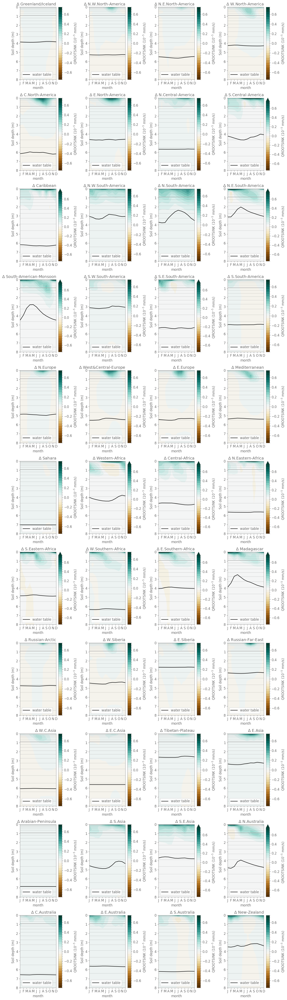

In [22]:
variable= 'QROOTSINK'


mask = regionmask.defined_regions.ar6.land.mask(ds_ctl_seasmean[variable])

region_ids = np.arange(0,44)
fig, axes = plt.subplots(11,4,figsize=(14,50))
axes = axes.flatten()


for i,region in enumerate(region_ids):
    
    ax = axes[i]

    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev


    da_ctl_seasmean_region = ds_ctl_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))*10**(5)
    da_ctl_seasmean_region_zwt = ds_ctl_seasmean['ZWT'].where(mask==region).mean(dim=('lat','lon'))

    levels = np.arange(-0.75,0.8,0.05)
    levels_ticks = [0,0.05,0.1,0.2,0.3,0.4,0.5, 0.6]

    ticks = levels_ticks
    
    
    da_ctl_seasmean_region.plot.contourf(ax=ax, x='month', y='levsoi', cmap='BrBG', cbar_kwargs={'label': da_ctl_seasmean_region.name+' (10$^{-5}$ mm/s)'}, levels=levels)
    ax.set_title(region_name, loc='right')
    ax.set_ylim([8,0])
    #da_ctl_seasmean_region_4p1000.plot(ax=ax, label='4p100', color='k')

    ax.hlines(levsoi_depth, 1,12, color='grey', alpha=0.2)
    ax.hlines(levsoi_depth[7],1,12, color='darkgrey', alpha=1)

    da_ctl_seasmean_region_zwt.plot(ax=ax, label='water table', color='k')
    ax.legend(loc='lower left') 
    ax.set_ylabel('Soil depth (m)')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

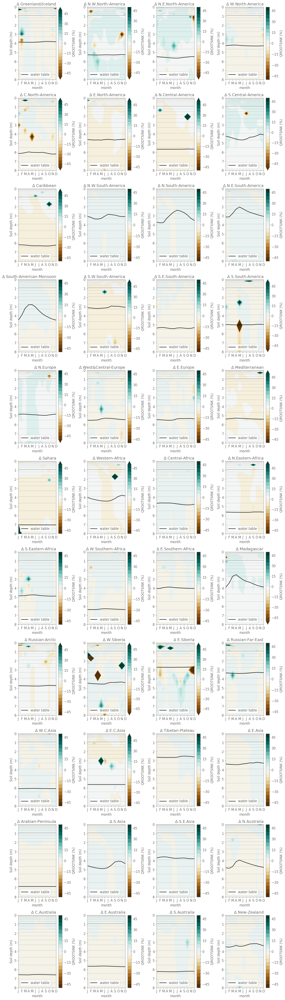

In [32]:
variable= 'QROOTSINK'


mask = regionmask.defined_regions.ar6.land.mask(ds_ctl_seasmean[variable])

region_ids = np.arange(0,44)
fig, axes = plt.subplots(11,4,figsize=(14,50))
axes = axes.flatten()


for i,region in enumerate(region_ids):
    
    ax = axes[i]

    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev


    da_delta_seasmean_region = (( ds_ctl_seasmean[variable].where(mask==region).mean(('lat','lon')) - ds_4pct_seasmean[variable].where(mask==region).mean(('lat','lon')))/ ds_ctl_seasmean[variable].where(mask==region).mean(('lat','lon')))*100
    da_ctl_seasmean_region_zwt = ds_ctl_seasmean['ZWT'].where(mask==region).mean(dim=('lat','lon'))

    levels = np.arange(-50,55,5)
    levels_ticks = [0,0.05,0.1,0.2,0.3,0.4,0.5, 0.6]

    ticks = levels_ticks
    
    
    da_delta_seasmean_region.plot.contourf(ax=ax, x='month', y='levsoi', cmap='BrBG', cbar_kwargs={'label': variable+' (%)'}, levels=levels)
    ax.set_title('$\Delta$ '+region_name, loc='right')
    ax.set_ylim([8,0])
    #da_ctl_seasmean_region_4p1000.plot(ax=ax, label='4p100', color='k')

    ax.hlines(levsoi_depth, 1,12, color='grey', alpha=0.2)
    ax.hlines(levsoi_depth[7],1,12, color='darkgrey', alpha=1)

    da_ctl_seasmean_region_zwt.plot(ax=ax, label='water table', color='k')
    ax.legend(loc='lower left') 
    ax.set_ylabel('Soil depth (m)')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

## Seasonal cycles per region

IndexError: index 11 is out of bounds for axis 0 with size 11

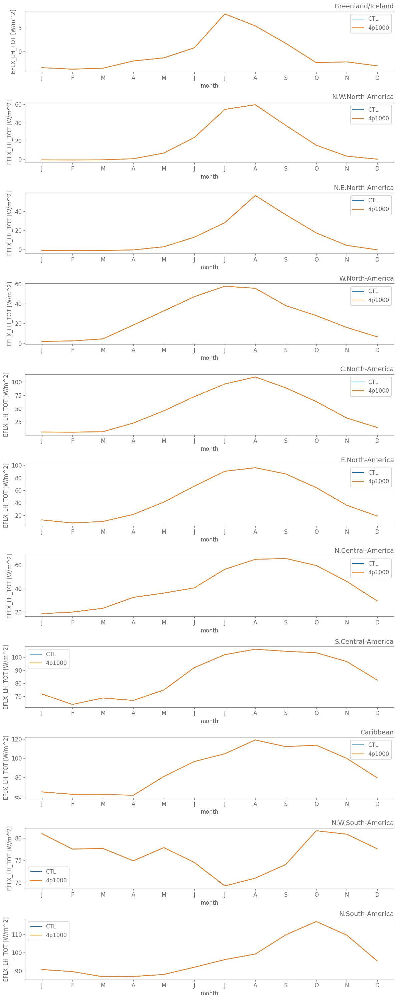

In [16]:
variable= 'EFLX_LH_TOT'

mask = regionmask.defined_regions.ar6.land.mask(ds_ctl_seasmean[variable])


region_ids = np.arange(0,44)
fig, axes = plt.subplots(11,figsize=(12,30))
axes = axes.flatten()


for i,region in enumerate(region_ids):
    
    ax = axes[i]


    region_name = regionmask.defined_regions.ar6.land[region].name

    da_ctl_seasmean_region = ds_ctl_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_ctl_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}
    da_4pct_seasmean_region = ds_4pct_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_4pct_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}

    
    da_ctl_seasmean_region.plot(ax=ax, label='CTL')
    da_4pct_seasmean_region.plot(ax=ax, label= '4p1000')
    
    ax.legend()

    ax.set_title(region_name, loc='right')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

In [ ]:
variable= 'EFLX_LH_TOT'

mask = regionmask.defined_regions.ar6.land.mask(ds_ctl_seasmean[variable])

region_ids = np.arange(0,44)
fig, axes = plt.subplots(11,4,figsize=(12,30))
axes = axes.flatten()


for i,region in enumerate(region_ids):
    
    ax = axes[i]


    region_name = regionmask.defined_regions.ar6.land[region].name

    da_ctl_seasmean_region = ds_ctl_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_ctl_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}
    da_4pct_seasmean_region = ds_4pct_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_4pct_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}

    da_delta_region = (da_4pct_seasmean_region - da_ctl_seasmean_region)/da_ctl_seasmean_region *100
    da_delta_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}
    
    da_delta_region.plot(ax=ax)
    
    ax.set_title(region_name, loc='right')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

In [ ]:
variable= 'QIRRIG_FROM_SURFACE'

mask = regionmask.defined_regions.ar6.land.mask(ds_ctl_seasmean[variable])


region_ids = np.arange(0,44)
fig, axes = plt.subplots(11,4,figsize=(12,30))
axes = axes.flatten()


for i,region in enumerate(region_ids):
    
    ax = axes[i]


    region_name = regionmask.defined_regions.ar6.land[region].name

    da_ctl_seasmean_region = ds_ctl_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_ctl_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}
    da_4pct_seasmean_region = ds_4pct_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_4pct_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}

    
    da_ctl_seasmean_region.plot(ax=ax, label='CTL')
    da_4pct_seasmean_region.plot(ax=ax, label= '4p1000')
    
    ax.legend()

    ax.set_title(region_name, loc='right')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

In [ ]:
variable= 'QIRRIG_FROM_SURFACE'

mask = regionmask.defined_regions.ar6.land.mask(ds_ctl_seasmean[variable])

region_ids = np.arange(0,44)
fig, axes = plt.subplots(11,4,figsize=(16,30))
axes = axes.flatten()


for i,region in enumerate(region_ids):
    
    ax = axes[i]


    region_name = regionmask.defined_regions.ar6.land[region].name

    da_ctl_seasmean_region = ds_ctl_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_ctl_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}
    da_4pct_seasmean_region = ds_4pct_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_4pct_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}

    da_delta_region = (da_4pct_seasmean_region - da_ctl_seasmean_region)/da_ctl_seasmean_region *100
    da_delta_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}
    
    da_delta_region.plot(ax=ax)
    
    ax.set_title(region_name, loc='right')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    ax.axhline(y=0, xmin=0, xmax=12, color='grey')
    fig.tight_layout()

In [ ]:
#"TWS",  "TOTSOILLIQ","TOTSOILICE", "SOILWATER_10CM",  "QINFL" , "QOVER", "QDRAI", "ZWT", "FH2OSFC",'EFLX_LH_TOT', 'QIRRIG_FROM_SURFACE', 'H2OSOI', "SOILLIQ","SOILICE" ]
variable= 'SOILWATER_10CM'

mask = regionmask.defined_regions.ar6.land.mask(ds_ctl_seasmean[variable])


region_ids = np.arange(0,44)
fig, axes = plt.subplots(11,4,figsize=(12,30))
axes = axes.flatten()


for i,region in enumerate(region_i£ds):
    
    ax = axes[i]


    region_name = regionmask.defined_regions.ar6.land[region].name

    da_ctl_seasmean_region = ds_ctl_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_ctl_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}
    da_4pct_seasmean_region = ds_4pct_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_4pct_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}

    
    da_ctl_seasmean_region.plot(ax=ax, label='CTL')
    da_4pct_seasmean_region.plot(ax=ax, label= '4p1000')
    
    ax.legend()

    ax.set_title(region_name, loc='right')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    ax.axhline(y=0, xmin=0, xmax=12)

    fig.tight_layout()

In [ ]:
#"TWS",  "TOTSOILLIQ","TOTSOILICE", "SOILWATER_10CM",  "QINFL" , "QOVER", "QDRAI", "ZWT", "FH2OSFC",'EFLX_LH_TOT', 'QIRRIG_FROM_SURFACE', 'H2OSOI', "SOILLIQ","SOILICE" ]
variable= 'SOILWATER_10CM'

mask = regionmask.defined_regions.ar6.land.mask(ds_ctl_seasmean[variable])

region_ids = np.arange(0,44)
fig, axes = plt.subplots(11,4,figsize=(12,30))
axes = axes.flatten()


for i,region in enumerate(region_ids):
    
    ax = axes[i]


    region_name = regionmask.defined_regions.ar6.land[region].name

    da_ctl_seasmean_region = ds_ctl_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_ctl_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}
    da_4pct_seasmean_region = ds_4pct_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_4pct_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}

    da_delta_region = (da_4pct_seasmean_region - da_ctl_seasmean_region)/da_ctl_seasmean_region *100
    da_delta_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}
    
    da_delta_region.plot(ax=ax)
    
    ax.set_title(region_name, loc='right')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

In [ ]:
#"TWS",  "TOTSOILLIQ","TOTSOILICE", "SOILWATER_10CM",  "QINFL" , "QOVER", "QDRAI", "ZWT", "FH2OSFC",'EFLX_LH_TOT', 'QIRRIG_FROM_SURFACE', 'H2OSOI', "SOILLIQ","SOILICE" ]
variable= 'QDRAI'

mask = regionmask.defined_regions.ar6.land.mask(ds_ctl_seasmean[variable])


region_ids = np.arange(0,44)
fig, axes = plt.subplots(11,4,figsize=(12,30))
axes = axes.flatten()


for i,region in enumerate(region_ids):
    
    ax = axes[i]


    region_name = regionmask.defined_regions.ar6.land[region].name

    da_ctl_seasmean_region = ds_ctl_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_ctl_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}
    da_4pct_seasmean_region = ds_4pct_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_4pct_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}

    
    da_ctl_seasmean_region.plot(ax=ax, label='CTL')
    da_4pct_seasmean_region.plot(ax=ax, label= '4p1000')
    
    ax.legend()

    ax.set_title(region_name, loc='right')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    ax.axhline(y=0, xmin=0, xmax=12)

    fig.tight_layout()

In [ ]:
#"TWS",  "TOTSOILLIQ","TOTSOILICE", "SOILWATER_10CM",  "QINFL" , "QOVER", "QDRAI", "ZWT", "FH2OSFC",'EFLX_LH_TOT', 'QIRRIG_FROM_SURFACE', 'H2OSOI', "SOILLIQ","SOILICE" ]
variable= 'QDRAI'

mask = regionmask.defined_regions.ar6.land.mask(ds_ctl_seasmean[variable])

region_ids = np.arange(0,44)
fig, axes = plt.subplots(11,4,figsize=(12,30))
axes = axes.flatten()


for i,region in enumerate(region_ids):
    
    ax = axes[i]


    region_name = regionmask.defined_regions.ar6.land[region].name

    da_ctl_seasmean_region = ds_ctl_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_ctl_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}
    da_4pct_seasmean_region = ds_4pct_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_4pct_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}

    da_delta_region = (da_4pct_seasmean_region - da_ctl_seasmean_region)/da_ctl_seasmean_region *100
    da_delta_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}
    
    da_delta_region.plot(ax=ax)
    
    ax.set_title(region_name, loc='right')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    ax.axhline(y=0, xmin=0, xmax=12, color='grey')

    fig.tight_layout()

In [ ]:
#"TWS",  "TOTSOILLIQ","TOTSOILICE", "SOILWATER_10CM",  "QINFL" , "QOVER", "QDRAI", "ZWT", "FH2OSFC",'EFLX_LH_TOT', 'QIRRIG_FROM_SURFACE', 'H2OSOI', "SOILLIQ","SOILICE" ]
variable= 'QOVER'

mask = regionmask.defined_regions.ar6.land.mask(ds_ctl_seasmean[variable])


region_ids = np.arange(0,44)
fig, axes = plt.subplots(11,4,figsize=(12,30))
axes = axes.flatten()


for i,region in enumerate(region_ids):
    
    ax = axes[i]


    region_name = regionmask.defined_regions.ar6.land[region].name

    da_ctl_seasmean_region = ds_ctl_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_ctl_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}
    da_4pct_seasmean_region = ds_4pct_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_4pct_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}

    
    da_ctl_seasmean_region.plot(ax=ax, label='CTL')
    da_4pct_seasmean_region.plot(ax=ax, label= '4p1000')
    
    ax.legend()

    ax.set_title(region_name, loc='right')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    ax.axhline(y=0, xmin=0, xmax=12)

    fig.tight_layout()

In [ ]:
#"TWS",  "TOTSOILLIQ","TOTSOILICE", "SOILWATER_10CM",  "QINFL" , "QOVER", "QDRAI", "ZWT", "FH2OSFC",'EFLX_LH_TOT', 'QIRRIG_FROM_SURFACE', 'H2OSOI', "SOILLIQ","SOILICE" ]
variable= 'QOVER'


mask = regionmask.defined_regions.ar6.land.mask(ds_ctl_seasmean[variable])

region_ids = np.arange(0,44)
fig, axes = plt.subplots(11,4,figsize=(12,30))
axes = axes.flatten()


for i,region in enumerate(region_ids):
    
    ax = axes[i]


    region_name = regionmask.defined_regions.ar6.land[region].name

    da_ctl_seasmean_region = ds_ctl_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_ctl_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}
    da_4pct_seasmean_region = ds_4pct_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_4pct_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}

    da_delta_region = (da_4pct_seasmean_region - da_ctl_seasmean_region)/da_ctl_seasmean_region *100
    da_delta_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}
    
    da_delta_region.plot(ax=ax)
    ax.axhline(y=0, xmin=0, xmax=12, color='grey')
    
    ax.set_title(region_name, loc='right')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

In [ ]:
#"TWS",  "TOTSOILLIQ","TOTSOILICE", "SOILWATER_10CM",  "QINFL" , "QOVER", "QDRAI", "ZWT", "FH2OSFC",'EFLX_LH_TOT', 'QIRRIG_FROM_SURFACE', 'H2OSOI', "SOILLIQ","SOILICE" ]
variable= 'ZWT'

mask = regionmask.defined_regions.ar6.land.mask(ds_ctl_seasmean[variable])


region_ids = np.arange(0,44)
fig, axes = plt.subplots(12,4,figsize=(12,30))
axes = axes.flatten()


for i,region in enumerate(region_ids):
    
    ax = axes[i]


    region_name = regionmask.defined_regions.ar6.land[region].name

    da_ctl_seasmean_region = ds_ctl_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_ctl_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}
    da_4pct_seasmean_region = ds_4pct_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_4pct_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}

    
    da_ctl_seasmean_region.plot(ax=ax, label='CTL')
    da_4pct_seasmean_region.plot(ax=ax, label= '4p1000')
    
    ax.legend()

    ax.set_title(region_name, loc='right')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    ax.axhline(y=0, xmin=0, xmax=12, color='grey')

    fig.tight_layout()

In [ ]:
#"TWS",  "TOTSOILLIQ","TOTSOILICE", "SOILWATER_10CM",  "QINFL" , "QOVER", "QDRAI", "ZWT", "FH2OSFC",'EFLX_LH_TOT', 'QIRRIG_FROM_SURFACE', 'H2OSOI', "SOILLIQ","SOILICE" ]
variable= 'ZWT'

mask = regionmask.defined_regions.ar6.land.mask(ds_ctl_seasmean[variable])

region_ids = np.arange(0,44)
fig, axes = plt.subplots(11,4,figsize=(12,30))
axes = axes.flatten()


for i,region in enumerate(region_ids):
    
    ax = axes[i]


    region_name = regionmask.defined_regions.ar6.land[region].name

    da_ctl_seasmean_region = ds_ctl_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_ctl_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}
    da_4pct_seasmean_region = ds_4pct_seasmean[variable].where(mask==region).mean(dim=('lat','lon'))
    da_4pct_seasmean_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}

    da_delta_region = (da_4pct_seasmean_region - da_ctl_seasmean_region)/da_ctl_seasmean_region *100
    da_delta_region.attrs = {'units':ds_ctl_seasmean[variable].attrs['units']}
    
    da_delta_region.plot(ax=ax)
    
    ax.set_title(region_name, loc='right')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    ax.axhline(y=0, xmin=0, xmax=12, color='grey')

    fig.tight_layout()

In [17]:
ds_4pct_seasampl = ds_4pct_seasmean.max(dim='month') - ds_4pct_seasmean.min(dim='month')
ds_ctl_seasampl  = ds_ctl_seasmean.max(dim='month') - ds_ctl_seasmean.min(dim='month')

In [18]:
ds_seasampl_delta = ds_4pct_seasampl - ds_ctl_seasampl

In [ ]:
ds_4pct_seasmean.max(dim='month')['QINFL'].plot(vmax=0.0001)

In [ ]:
d_vlims = { "QDRAI"         : [-1e-7,1e-7], 
           "QINFL"         : [-1e-6,1e-6],
           "QOVER"         : [-1e-7,1e-7],
           "TOTSOILLIQ"    : [-20,20],
           "TOTSOILICE"    :  [-20,20], 
           "SOILWATER_10CM": [-4,4],
           "TWS"           : [-8,8],
           "ZWT"           : [-0.005,0.005], 
           "FH2OSFC"       : [-0.002,0.002]}


for i, variable in enumerate(variables): 

    da_delta = ds_seasampl_delta[variable]
    da_delta.attrs = ds_ctl[variable].attrs

    vlims = d_vlims[variable]
    cmap = 'BrBG'
    plt.figure(figsize=(12,5))
    proj=ccrs.PlateCarree()
    ax = plt.subplot(111, projection=proj)
        
    # limiting values for plotting are given    
    if vlims==False: 
        da_delta.plot(ax=ax, cmap=cmap, cbar_kwargs={'label': da_delta.name+' ('+da_delta.units+')', 'fraction': 0.02, 'pad': 0.04})
    else: 
        da_delta.plot(ax=ax, cmap=cmap, vmin=vlims[0], vmax=vlims[1], extend='both',  cbar_kwargs={'label': da_delta.name+' ('+da_delta.units+')', 'fraction': 0.02, 'pad': 0.04}, add_labels=False)
        
    ax.set_title(da_delta.long_name, loc='right')
    ax.coastlines(color='dimgray', linewidth=0.5)
    # exclude Antactica from plot
    ax.set_extent((-180,180,-63,90), crs=proj) 



variables
 
nbedrock  - index of shallowest bedrock layer

EFLX_DYNBAL  -  dynamic land cover change conversion energy flux

EFLX_LH_TOT  -  total latent heat flux [+ to atm]

FH2OSFC      - fraction of ground covered by surface water

FSH       -  sensible heat not including correction for land use change and rain/snow conversion

H2OSOI    - volumetric soil water (natural vegetated and crop landunits only)

QDRAI   -  sub-surface drainage

QDRAI_PERCH   -  perched wt drainage

QDRAI_XS   -  saturation excess drainage

QFLOOD   - runoff from river flooding

QFLX_EVAP_TOT -- qflx_evap_soi + qflx_evap_can + qflx_tran_veg


QH2OSFC -  surface water runoff

QHR   -   hydraulic redistribution

QINFL - infiltration

QOVER   - total surface runoff

QRUNOFF   -  total liquid runoff not including correction for land use change

QSOIL   -   Ground evaporation (soil/snow evaporation + soil/snow sublimation - dew)

SMP   -  soil matric potential (natural vegetated and crop landunits only)

SOILICE    -  soil ice (natural vegetated and crop landunits only)

SOILLIQ     --  soil liquid water (natural vegetated and crop landunits only)

SOILRESIS  -  soil ice (natural vegetated and crop landunits only)


SOILWATER_10CM   -    soil liquid water + ice in top 10cm of soil (veg landunits only)


TOTSOILICE   - vertically summed soil cie (veg landunits only)

TOTSOILLIQ   -  vertically summed soil liquid water (veg landunits only)

VOLR  - river channel total water storage

ZWT  -  water table depth (natural vegetated and crop landunits only)

ZWT_PERCH  -  perched water table depth (natural vegetated and crop landunits only)



## OLD

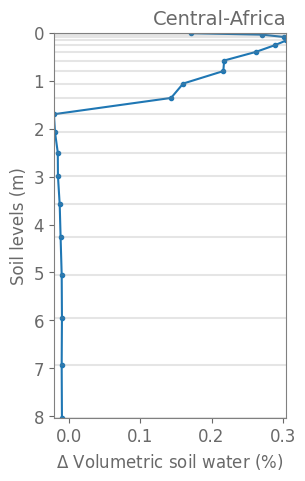

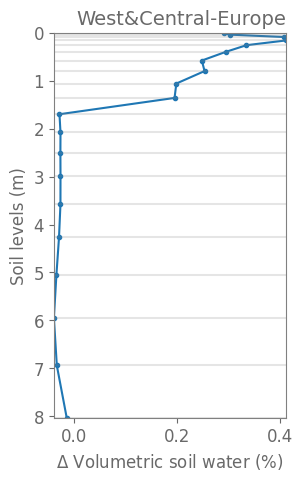

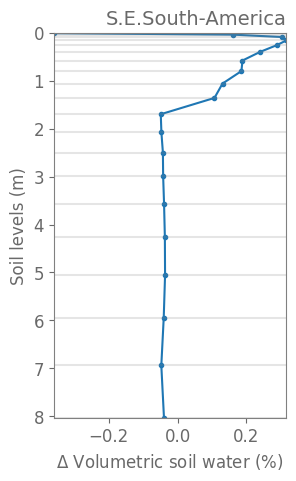

In [14]:
variable= 'H2OSOI'

mask = regionmask.defined_regions.ar6.land.mask(ds_delta[variable])

for region in [22,17, 14]:


    region_name = regionmask.defined_regions.ar6.land[region].name

    da_delta = (ds_delta['H2OSOI'].mean('time')) / ( ds_4pct['H2OSOI'].mean('time')  )*100


    region_mean = da_delta.where(mask==region).mean(dim=('lat','lon'))
    fig, ax = plt.subplots(1,1,figsize=(3,5))



    # check ground levels
    ax.plot( region_mean.values, region_mean.levsoi.values, marker='.', color='tab:blue')
    ax.hlines(region_mean.levsoi.values,  region_mean.values.min(),  region_mean.values.max(), color='grey', alpha=0.2)
    #ax.set_yticks(region_mean.levsoi.values)
    ax.set_ylabel('Soil levels (m)')
    ax.set_xlabel('$\Delta$ Volumetric soil water (%)'); 
    ax.set_ylim([max(region_mean.levsoi.values),0]); 
    ax.set_xlim([region_mean.values.min(),  region_mean.values.max()]); 

    ax.set_title(region_name, loc='right')


NameError: name 'zbedrock_withsoil' is not defined

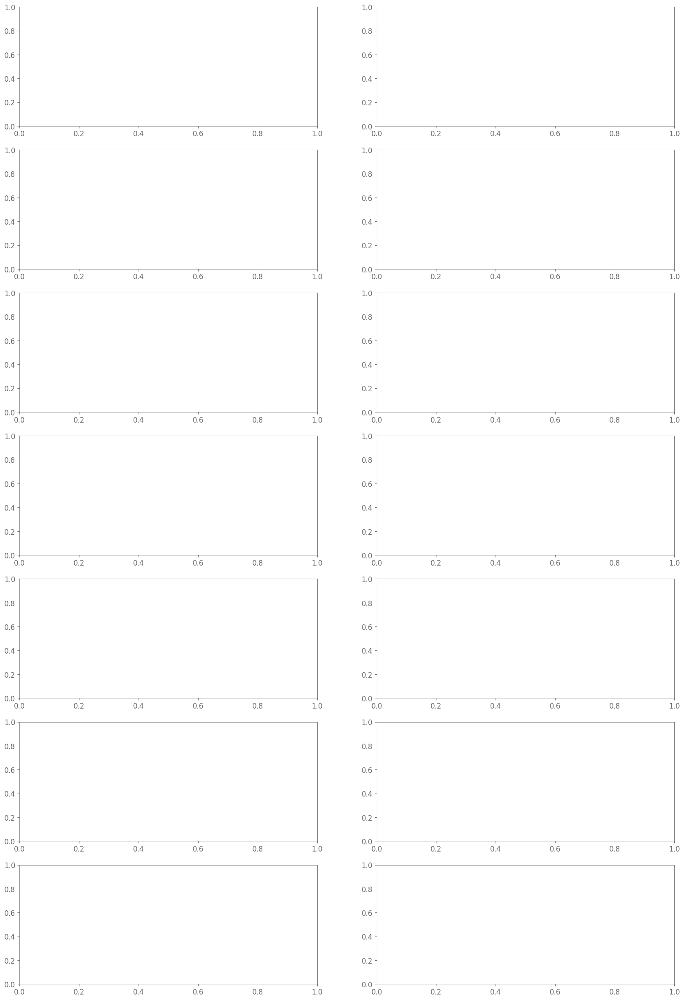

In [14]:
fig, axes = plt.subplots(7,2,figsize=(20,30))
axes = axes.flatten()

cmap = 'pink_r'

for i, soil_depth in enumerate(levsoi_depth[7:]): 

    zbedrock.where(zbedrock>0).where(zbedrock_withsoil<=soil_depth).plot(ax=axes[i], cmap=cmap, cbar_kwargs={'label': zbedrock.name+' ('+zbedrock.units+')', 'fraction': 0.02, 'pad': 0.04})
    axes[i].set_title('Soil depth <= '+str(soil_depth)+' m', loc='right')
    axes[i].axis('off')
    
    
zbedrock.where(zbedrock>0).where(zbedrock_withsoil>soil_depth).plot(ax=axes[i+1], cmap=cmap, cbar_kwargs={'label': zbedrock.name+' ('+zbedrock.units+')', 'fraction': 0.02, 'pad': 0.04})
axes[i+1].set_title('Soil depth >'+str(soil_depth)+' m', loc='right')    
axes[i+1].axis('off')

fig.tight_layout()